# Analysis excercies

In [1]:
#%matplotlib widget
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
from Star import *
import os

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [3]:
path ='/Users/macbook/Downloads/Astronomia_lab_Cupani/'
reduced_V = [ fits.open(path + 'reduced_V/reduced_V_{:04d}.fit'.format(i))[0].data for i in range(1, 244) ]
sci_V = [fits.open(path+'SZ_Lyn-{:04d}_V.fit'.format(i))[0] for i in range(1,244)]


In [4]:
print(len(reduced_V))

243


In [5]:
print(len(sci_V))

243


In [6]:
#How to find the data as well
reduced_V[0].data


In [7]:
#Different regions
reg = np.s_[800:920,550:670]
region_bjr_415= np.s_[630:750,790:910]
region_bjr_416= np.s_[550:670,480:600]

In [8]:
def finding_best_thr(variable_star):
    SNR=[]
    area = []
    star_flux = []
    area_background = []
    threshold = []
    for i in range(-2, 25):
        if i > 0:
            variable_star.photometry(thr=15+i, thr1=20+i, thr2=30+i+1, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
        if i < 0:
            variable_star.photometry(thr=15+i, thr1=20+i, thr2=30+i-1, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
        threshold.append(15+i)
        SNR.append(variable_star.snr)
        area.append(variable_star.area)
        star_flux.append(variable_star.flux)
        area_background.append(variable_star.area_bckg)
#Find the position of the maximum SNR and associate it to the threshold value 
# Convert to NumPy array if not already
    SNR_array = np.array(SNR)

# Find the index of the maximum SNR
    max_index = np.argmax(SNR_array)

# Get the corresponding threshold value
    best_threshold = threshold[max_index]
    return best_threshold 

In [9]:
class LightCurve():
    
    def __init__(self):
        """ @brief Initialize a light curve
        """

        self.jd = np.array([])
        self.flux = np.array([])
        self.err = np.array([])
        self.mag = np.array([])
        self.mag_err = np.array([])
    
    
    def add(self, star):
        """ @brief Add a data point to a light curve
        @param star Object of class 'Star' containing the information to add the data point
        """

        self.jd = np.append(self.jd, star.meta['JD-HELIO'])
        self.flux = np.append(self.flux, star.flux)
        self.err = np.append(self.err, star.err)

In [10]:
def plot_2d(data, figsize=(8,8), xlabel='x pixel', ylabel='y pixel', vrange=200, ax=None):
    """ @brief Plot a 2-d array
        @param data 2-d array
        @param figsize Figure size
        @param xlabel X-axis label
        @param ylabel Y-axis label
        @param vrange Range of values around median
        @param ax Axes to overplot on
    """

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if vrange is not None:
        import numpy as np
        vmed = np.median(data)
        vmin, vmax = vmed-vrange/2, vmed+vrange/2
        ax.imshow(data, vmin=vmin, vmax=vmax)
    else:
        ax.imshow(data)
    
    return ax   # ...so it can be used to overplot other stuff
    

def plot_1d(data_x, data_y, figsize=(12,8), xlabel='x pixel', ylabel='y pixel', kind='plot', color='C0', ax=None):
    """ @brief Plot two 1-d arrays one versus the other
        @param data_x 1-d array of x values
        @param data_y 1-d array of y values
        @param figsize Figure size
        @param xlabel X-axis label
        @param ylabel Y-axis label
        @param kind Kind of plot ('plot', 'scatter', 'step')
        @param color Color of plot
        @param ax Axes to overplot on
    """

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    getattr(ax, kind)(data_x, data_y, color=color)  # getattr(ax, 'plot') -> plt.plot, etc.
    
    return ax

In [11]:
def plot(self, attr='flux', color='C0', ax=None):  # Note that 'self' is included as the first argument
    """ @brief Plot a light curve
    @param Attribute of 'Star' to be plotted
    """
    ax = plot_1d(self.jd, getattr(self, attr), xlabel='JD', ylabel=attr, kind='scatter', color=color, ax=ax)
    return ax


In [14]:
best_thr_array=[]
SNR_array=[]
sz_lyn_lc = LightCurve()
for i in range(243):
        variable_star = Star(reduced_V[i], reg, sci_V[i])
        best_thr=finding_best_thr(variable_star)
        best_thr_array.append(best_thr)
        variable_star.photometry(thr=best_thr, thr1=best_thr+10, thr2=best_thr+20, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
        SNR_array.append(variable_star.snr)
        sz_lyn_lc.add(variable_star)

In [85]:
bjr_415_lc = LightCurve()
bjr_416_lc = LightCurve()
error_bjr_415=[]
error_bjr_416=[]
region_bjr_415= np.s_[630:750,790:910]
region_bjr_416= np.s_[550:670,480:600]
for i in range(243):
        bjr_415 = Star(reduced_V[i], region_bjr_415,  sci_V[i])
        best_thr=finding_best_thr(bjr_415)        
        bjr_415.photometry(thr=best_thr_array[i], thr1=best_thr_array[i]+10, thr2=best_thr_array[i]+25, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
        bjr_415_lc.add(bjr_415)
        error_bjr_415.append(bjr_415.err)
        
        bjr_416 = Star(reduced_V[i],region_bjr_416,  sci_V[i])
        best_thr=finding_best_thr(bjr_416)
        bjr_416.photometry(thr=best_thr_array[i], thr1=best_thr_array[i]+10, thr2=best_thr_array[i]+25, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
        bjr_416_lc.add(bjr_416)
        error_bjr_416.append(bjr_415.err)
average_error_bjr_415=np.mean(error_bjr_415)
average_error_bjr_416=np.mean(error_bjr_416)

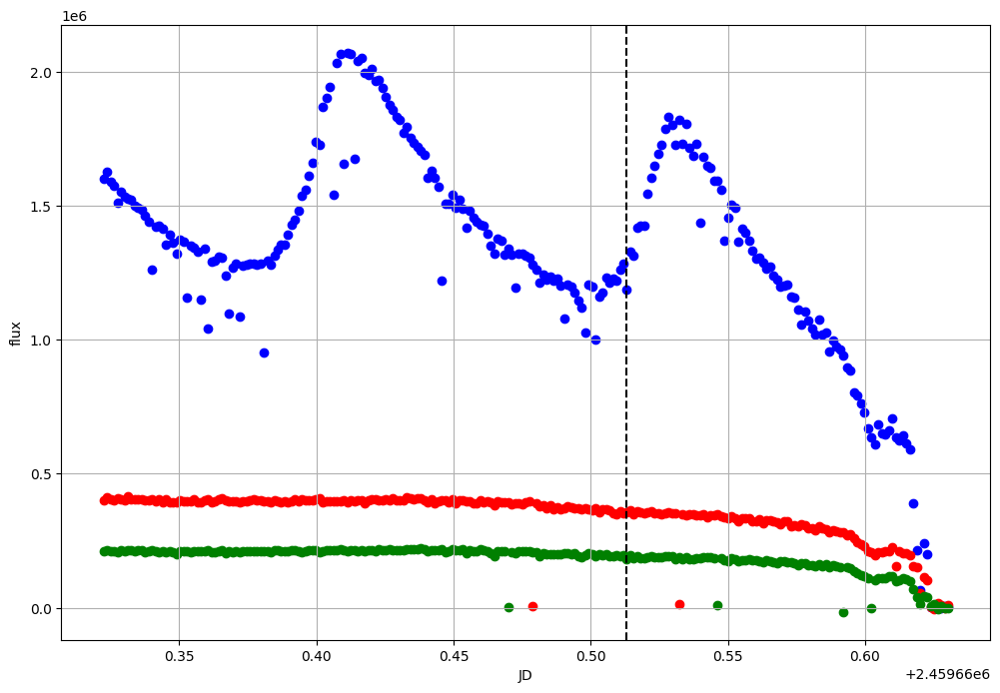

In [16]:
LightCurve.plot = plot


ax = sz_lyn_lc.plot(color='b')
bjr_415_lc.plot(color='r', ax=ax)
bjr_416_lc.plot(color='g', ax=ax)

    #print(idx)
ax.axvline(x=bjr_416_lc.jd[150], color='BLACK', linestyle='--', label='Index 149')
plt.grid(True)
plt.show()

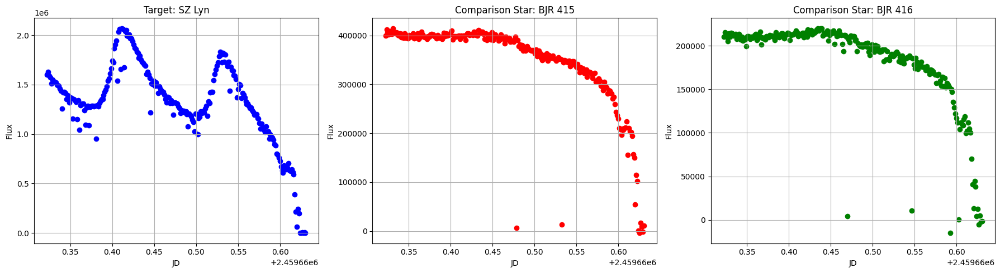

In [17]:
fig, axs = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

# Target
sz_lyn_lc.plot(color='b', ax=axs[0])
axs[0].set_title("Target: SZ Lyn")
axs[0].set_xlabel("JD")
axs[0].set_ylabel("Flux")
axs[0].grid(True)
# Comparison Star 1
bjr_415_lc.plot(color='r', ax=axs[1])
axs[1].set_title("Comparison Star: BJR 415")
axs[1].set_xlabel("JD")
axs[1].set_ylabel("Flux")
axs[1].grid(True)
# Comparison Star 2
bjr_416_lc.plot(color='g', ax=axs[2])
axs[2].set_title("Comparison Star: BJR 416")
axs[2].set_xlabel("JD")
axs[2].set_ylabel("Flux")
axs[2].grid(True)
plt.tight_layout()
plt.show()

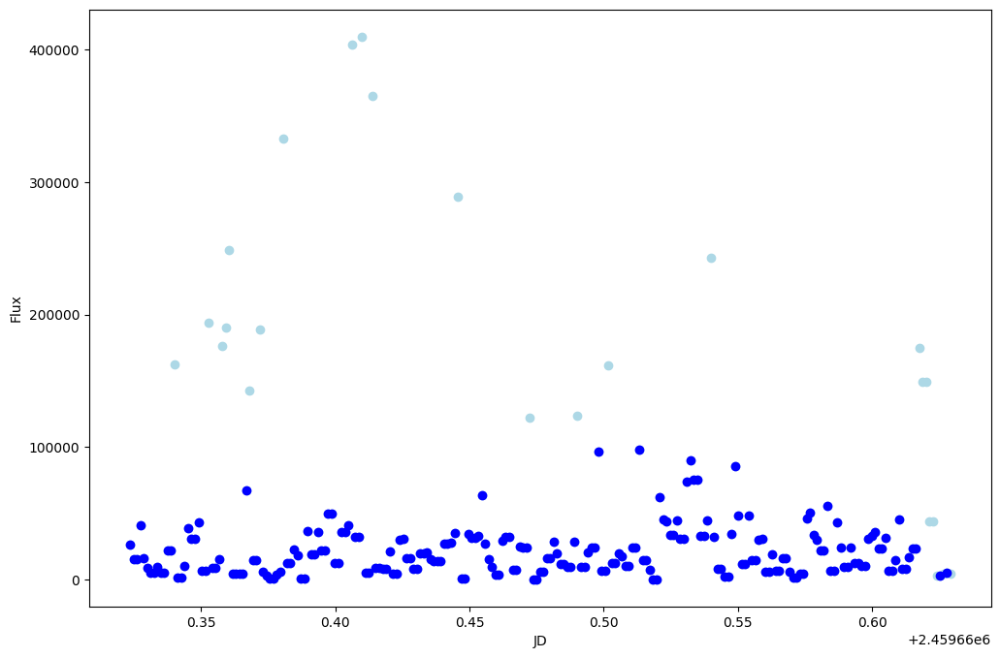

[ 13  23  27  28  29  35  38  45  65  68  71  96 117 131 140 170 231 232
 233 234 235 236 238 240]
JDs of big jumps: [2459660.34017777 2459660.35287345 2459660.35795404 2459660.3592271
 2459660.36050014 2459660.36812679 2459660.37194591 2459660.38083405
 2459660.40623698 2459660.41005607 2459660.4138752  2459660.44571248
 2459660.47246946 2459660.49028017 2459660.50173757 2459660.53994034
 2459660.61758448 2459660.61886911 2459660.62013103 2459660.62140408
 2459660.62267687 2459660.62393845 2459660.62649621 2459660.62904219]
Fluxes at those points: [1260035.11261888 1157145.01192137 1150016.09903548 1340342.20819399
 1041729.87324457 1096572.28213091 1086891.07202662  952193.67289701
 1540242.13800085 1655200.43632395 1674739.09134391 1218942.10938206
 1193660.63398358 1077035.17979563 1000875.44146039 1437344.13761459
  388630.44688372  213704.99231392   64902.52597846  242109.4001434
  198464.83516095    2764.84565644    4203.35434226    5320.66140273]


In [18]:
d = np.minimum(np.abs(np.diff(sz_lyn_lc.flux[:-1])), np.abs(np.diff(sz_lyn_lc.flux[1:])))
flux = sz_lyn_lc.flux

d_rel = d / flux[1:-1]
w = d_rel < 0.1  # threshold: 5% change

ax = plot_1d(sz_lyn_lc.jd[1:-1], d, kind='scatter', color='lightblue')
plot_1d(sz_lyn_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)

ax.set_ylabel("Flux")
plt.show()
bad_indices_sz_lyn = np.where(~w)[0]
print(bad_indices_sz_lyn)
jd = sz_lyn_lc.jd[1:-1]  # same length as w
flux = sz_lyn_lc.flux

print("JDs of big jumps:", jd[~w])
print("Fluxes at those points:", flux[1:-1][~w])

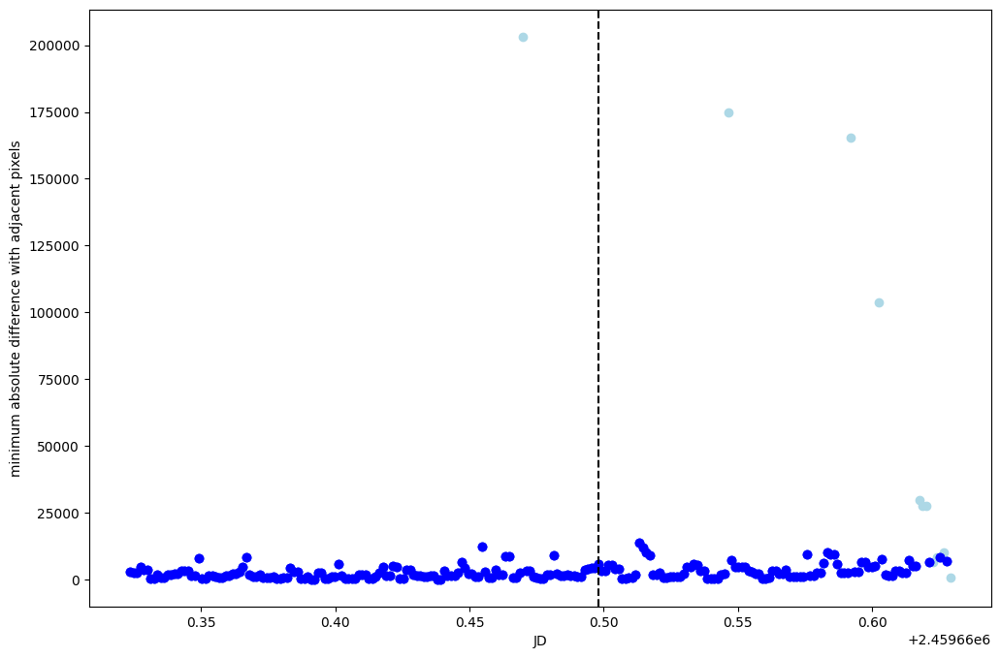

[115 175 211 219 231 232 233 235 236 238 240]
JDs of big jumps: [2459660.46991181 2459660.54629396 2459660.59213536 2459660.60233095
 2459660.61758448 2459660.61886911 2459660.62013103 2459660.62267687
 2459660.62393845 2459660.62649621 2459660.62904219]
Fluxes at those points: [  4040.03844645  10705.13732146 -15232.36221122    468.12186073
  70307.58548705  40621.32194128  13006.10253366  37977.94949905
   4491.99887872  -5308.51411902  -2105.29131873]


In [19]:
d = np.minimum(np.abs(np.diff( bjr_416_lc.flux[:-1])), np.abs(np.diff( bjr_416_lc.flux[1:])))
d_rel = d / flux[1:-1]
w = d_rel < 0.03 # threshold: 2% change

#print(w)

jd = bjr_416_lc.jd[1:-1][w]
mag = bjr_416_lc.flux[1:-1][w]
ax = plot_1d(bjr_416_lc.jd[1:-1], d, kind='scatter', color='lightblue')
plot_1d(bjr_416_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)
plot_1d(bjr_416_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)
ax.axvline(x=bjr_416_lc.jd[138], color='BLACK', linestyle='--', label='Index 149')
#20  61  97 105 115 136 149 168
#ax.axvline(x=bjr_416_lc.jd[20], color='BLACK', linestyle='--', label='Index 149')
plt.show()
average_error_bjr_416
bad_indices_bjr = np.where(~w)[0]
print(bad_indices_bjr)
jd = bjr_416_lc.jd[1:-1]  # same length as w
flux = bjr_416_lc.flux

print("JDs of big jumps:", jd[~w])
print("Fluxes at those points:", flux[1:-1][~w])

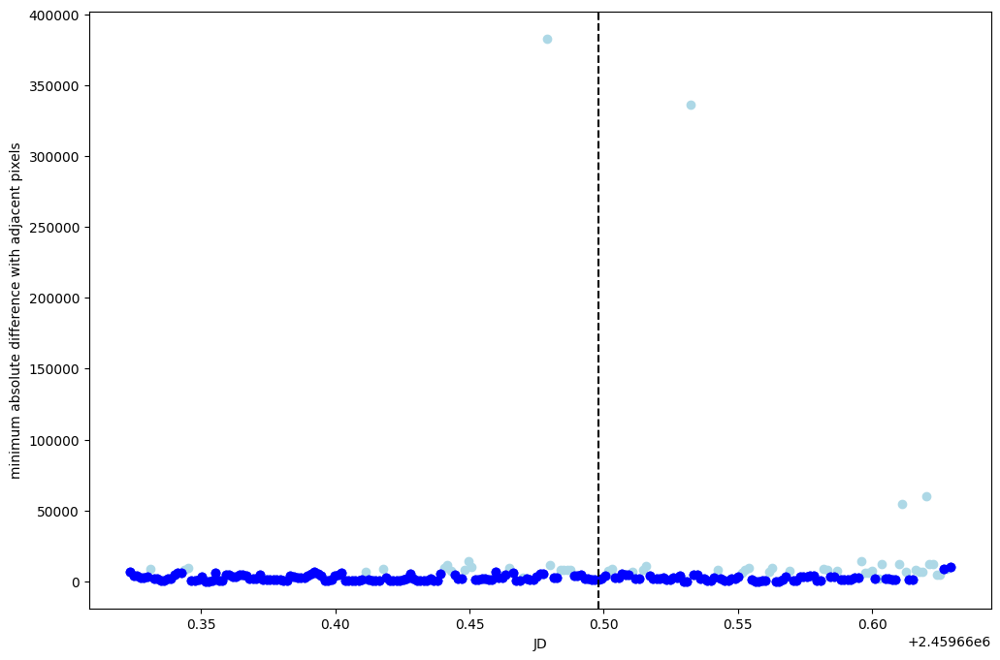

[  6  16  17  69  74  92  93  94  98  99 100 111 115 122 123 126 127 128
 129 140 141 147 150 151 164 172 179 180 181 187 188 193 203 204 207 214
 215 216 217 219 220 225 226 227 230 231 232 233 234 235 236 237 239]
JDs of big jumps: [2459660.33127808 2459660.34398531 2459660.34525837 2459660.41132907
 2459660.41770587 2459660.44062031 2459660.44188179 2459660.44316638
 2459660.44824698 2459660.44953161 2459660.45080465 2459660.46481966
 2459660.46991181 2459660.47882302 2459660.48009612 2459660.48391523
 2459660.48518825 2459660.4864613  2459660.48773432 2459660.50173757
 2459660.50302218 2459660.51066042 2459660.5144911  2459660.51575259
 2459660.53229053 2459660.5424864  2459660.55138611 2459660.5526591
 2459660.55393211 2459660.56157036 2459660.56285494 2459660.56922043
 2459660.58195105 2459660.58322409 2459660.58704318 2459660.59595422
 2459660.59722722 2459660.59850034 2459660.59977335 2459660.60233095
 2459660.60359241 2459660.60995761 2459660.61123064 2459660.61250343
 2459660

In [20]:
d = np.minimum(np.abs(np.diff( bjr_415_lc.flux[:-1])), np.abs(np.diff( bjr_415_lc.flux[1:])))
d_rel = d / flux[1:-1]
w = d_rel < 0.03 # threshold: 3% change



jd = bjr_415_lc.jd[1:-1][w]
mag = bjr_415_lc.flux[1:-1][w]
ax = plot_1d(bjr_415_lc.jd[1:-1], d, kind='scatter', color='lightblue')
plot_1d(bjr_415_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)
plot_1d(bjr_415_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)
ax.axvline(x=bjr_415_lc.jd[138], color='BLACK', linestyle='--', label='Index 149')
plt.show()
average_error_bjr_415
bad_indices_bjr_415 = np.where(~w)[0]
print(bad_indices_bjr_415)
jd = bjr_415_lc.jd[1:-1]  # same length as w
flux = bjr_415_lc.flux

print("JDs of big jumps:", jd[~w])
print("Fluxes at those points:", flux[1:-1][~w])

## Outliers in the flux

[ 13  23  27  28  29  35  38  45  65  68  71  96 117 131 140 170 231 232
 233 234 235 236 238 240]

13
The star flux
1183397.1338615683
The star SNR
766.7706877992313


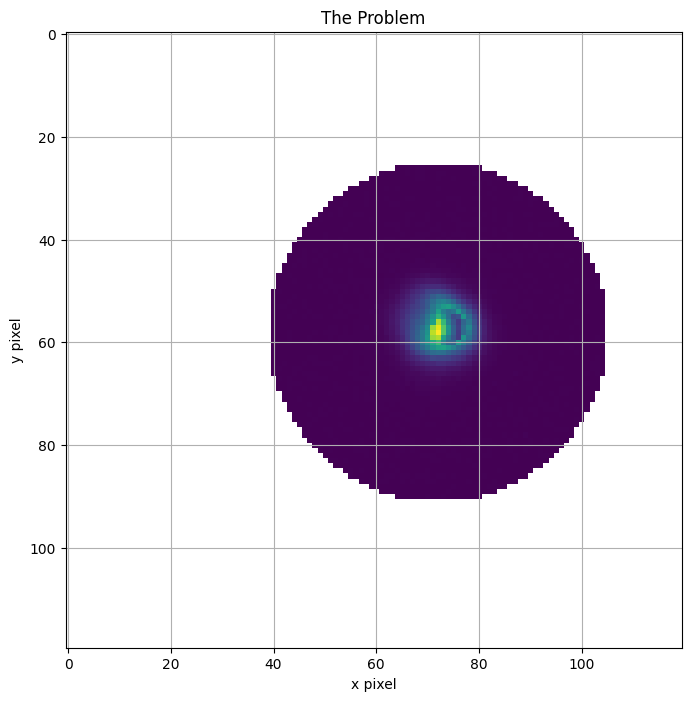

1260035.1126188776


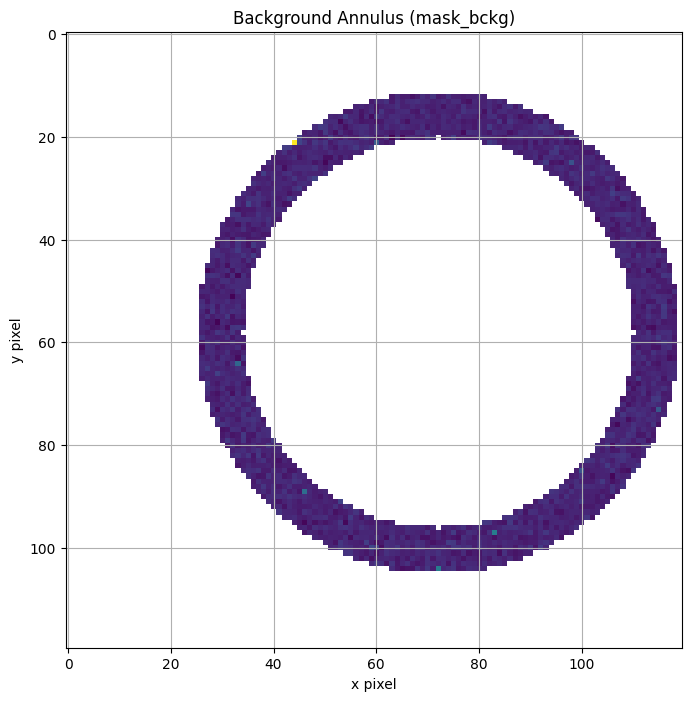

In [23]:
i=23+1
variable_star = Star(reduced_V[i], reg, sci_V[i])
variable_star.photometry(thr=best_thr_array[i]+20, thr1=best_thr_array[i]+25, thr2=best_thr_array[i]+34, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
print(best_thr_array[i])

print("The star flux")
print(variable_star.flux)
print("The star SNR")
print(variable_star.snr)
#997524.0791596372
#904.0473818662686
SNR_array[i] = variable_star.snr
#sz_lyn_lc.snr[14]=variable_star.snr
#best_background_min[14]=thr1
#best_background_max[14]=thr2

#print(variable_star.snr)

plot_2d(variable_star.targ_sub, vrange=None)
plt.title("The Problem")
plt.grid('True')
plt.show()
#sz_lyn_lc.flux[14]=variable_star.flux
#1265836.5739887592
#1268466.2813722242
#1269288.1833080759
print(sz_lyn_lc.flux[14])
##The one before has 1366785.4760777184
masked_bckg = np.full_like(variable_star.sub_img, np.nan)
masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]
plot_2d(masked_bckg, vrange=None)
plt.title("Background Annulus (mask_bckg)")
plt.grid('True')
plt.show()


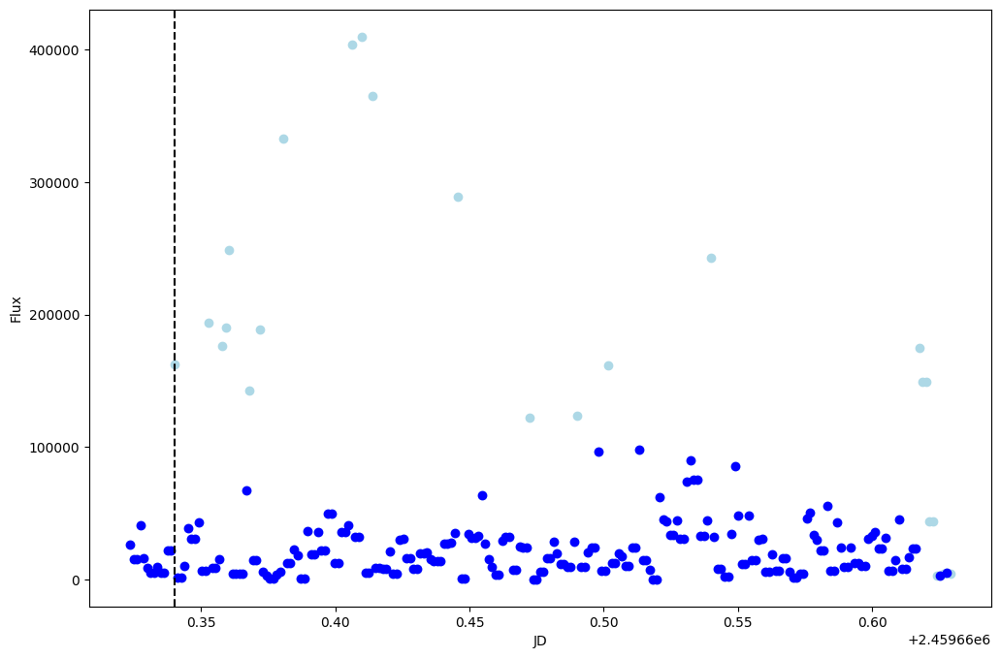

[ 13  23  27  28  29  35  38  45  65  68  71  96 117 131 140 170 231 232
 233 234 235 236 238 240]
JDs of big jumps: [2459660.34017777 2459660.35287345 2459660.35795404 2459660.3592271
 2459660.36050014 2459660.36812679 2459660.37194591 2459660.38083405
 2459660.40623698 2459660.41005607 2459660.4138752  2459660.44571248
 2459660.47246946 2459660.49028017 2459660.50173757 2459660.53994034
 2459660.61758448 2459660.61886911 2459660.62013103 2459660.62140408
 2459660.62267687 2459660.62393845 2459660.62649621 2459660.62904219]
Fluxes at those points: [1260035.11261888 1157145.01192137 1150016.09903548 1340342.20819399
 1041729.87324457 1096572.28213091 1086891.07202662  952193.67289701
 1540242.13800085 1655200.43632395 1674739.09134391 1218942.10938206
 1193660.63398358 1077035.17979563 1000875.44146039 1437344.13761459
  388630.44688372  213704.99231392   64902.52597846  242109.4001434
  198464.83516095    2764.84565644    4203.35434226    5320.66140273]


In [24]:
d = np.minimum(np.abs(np.diff(sz_lyn_lc.flux[:-1])), np.abs(np.diff(sz_lyn_lc.flux[1:])))
flux = sz_lyn_lc.flux

d_rel = d / flux[1:-1]
w = d_rel < 0.1  # threshold: 5% change

ax = plot_1d(sz_lyn_lc.jd[1:-1], d, kind='scatter', color='lightblue')
plot_1d(sz_lyn_lc.jd[1:-1][w], d[w], 
        xlabel='JD', ylabel='minimum absolute difference with adjacent pixels', 
        kind='scatter', color='blue', ax=ax)

ax.set_ylabel("Flux")
ax.axvline(sz_lyn_lc.jd[14], color='BLACK', linestyle='--', label='Index 149')
plt.show()
bad_indices_sz_lyn = np.where(~w)[0]
print(bad_indices_sz_lyn)
jd = sz_lyn_lc.jd[1:-1]  # same length as w
flux = sz_lyn_lc.flux

print("JDs of big jumps:", jd[~w])
print("Fluxes at those points:", flux[1:-1][~w])

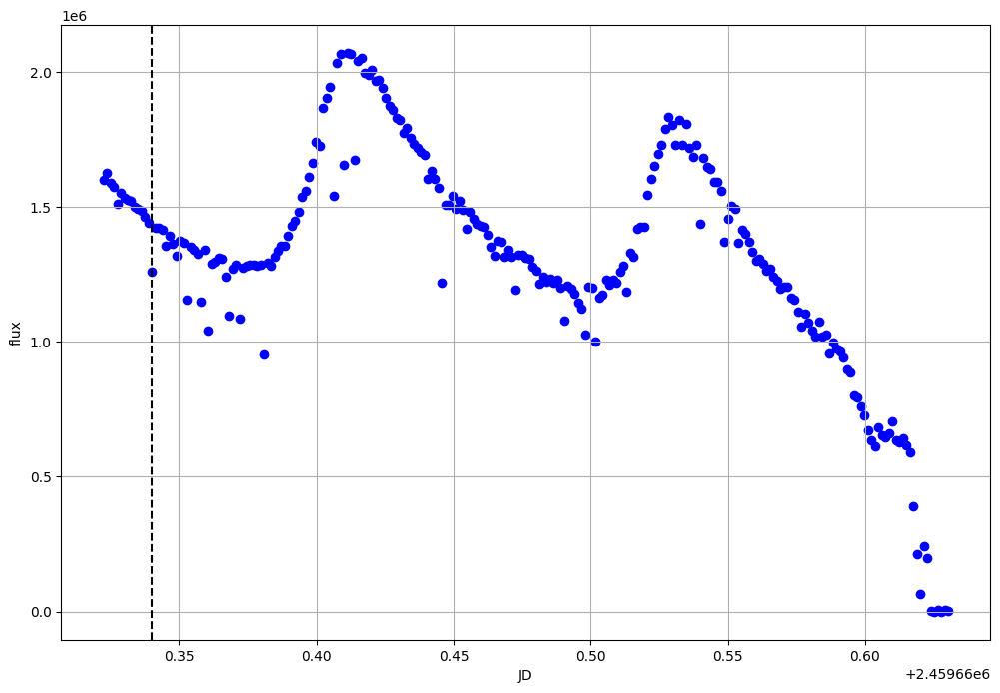

In [25]:
LightCurve.plot = plot


ax = sz_lyn_lc.plot(color='b')
ax.axvline(sz_lyn_lc.jd[14], color='BLACK', linestyle='--', label='Index 149')
ax.grid(True)

In [26]:
print(len(sz_lyn_lc.flux))


243


(slice(800, 920, None), slice(550, 670, None))

Index: 14
Best threshold: 20
The star flux: 1271932.2658952957
The star SNR : 803.085209571202


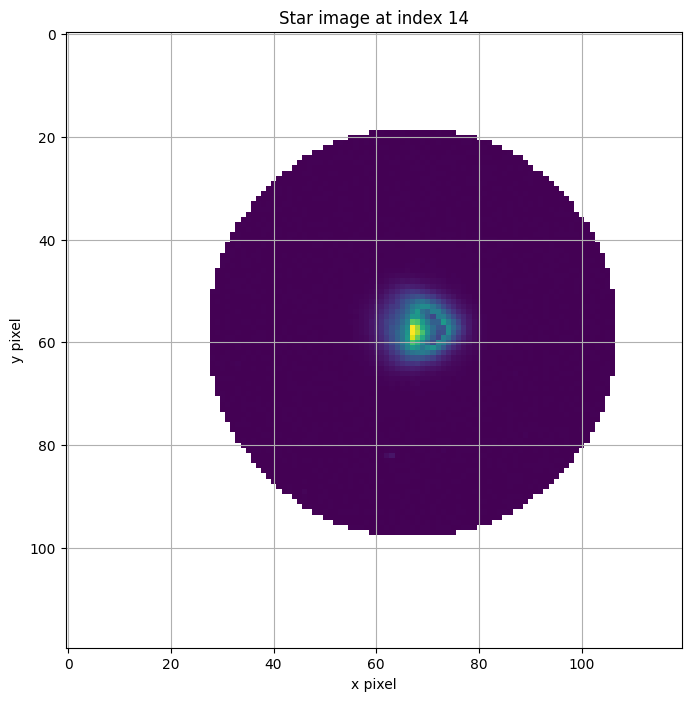

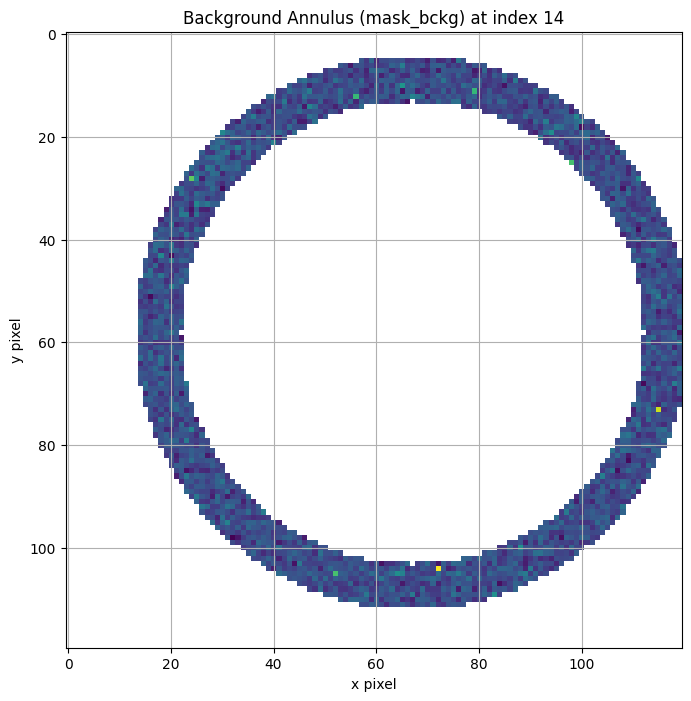

Stored flux at index 14 (unchanged): 1271932.2658952957

Index: 24
Best threshold: 13
The star flux: 1183397.1338615683
The star SNR : 766.7706877992313


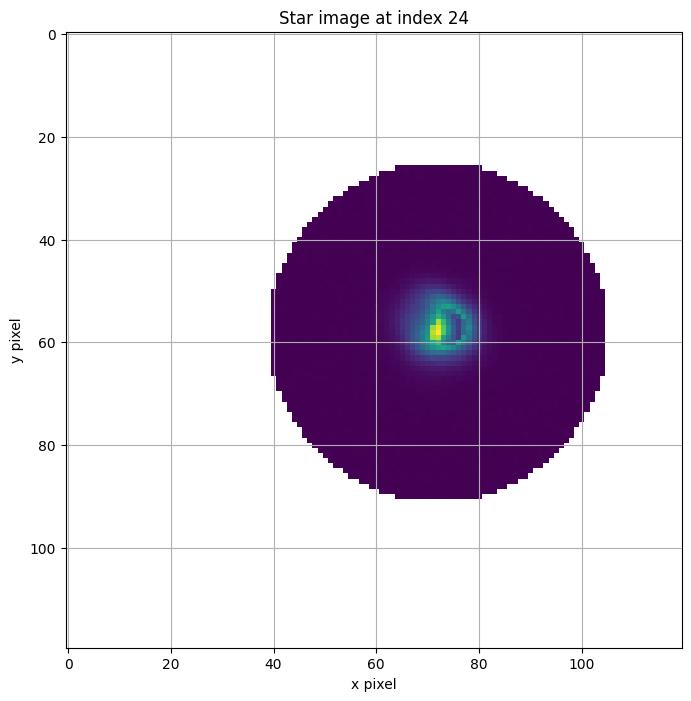

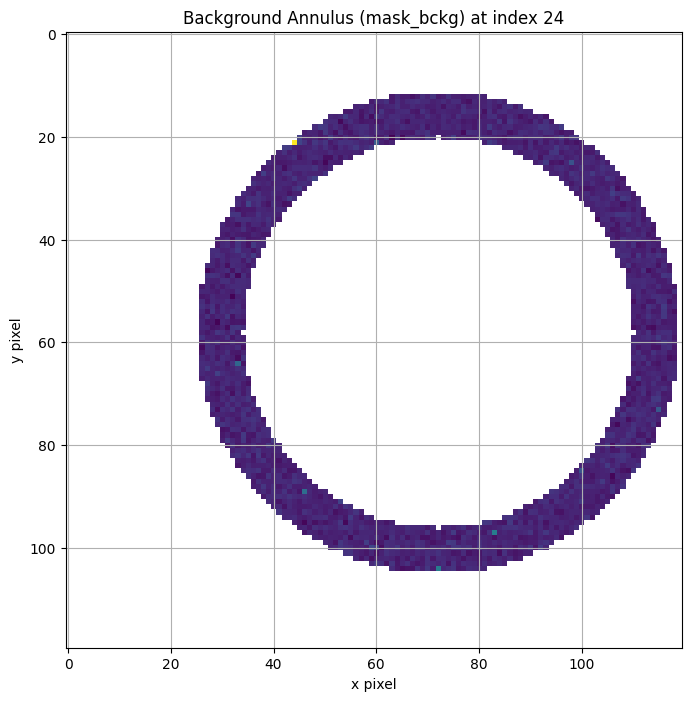

Stored flux at index 24 (unchanged): 1271932.2658952957

Index: 28
Best threshold: 13
The star flux: 1178984.1224095006
The star SNR : 816.4330109845853


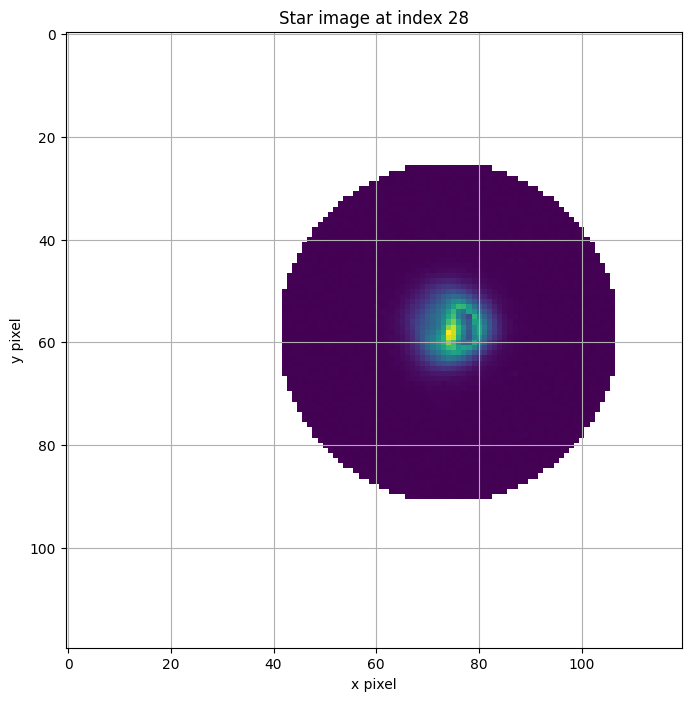

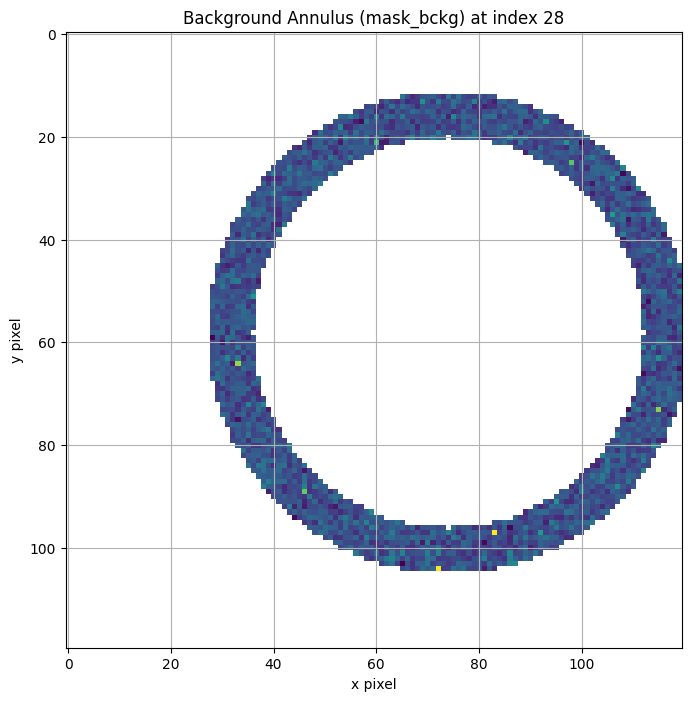

Stored flux at index 28 (unchanged): 1271932.2658952957

Index: 29
Best threshold: 13
The star flux: 1372201.0432781912
The star SNR : 918.7301374003846


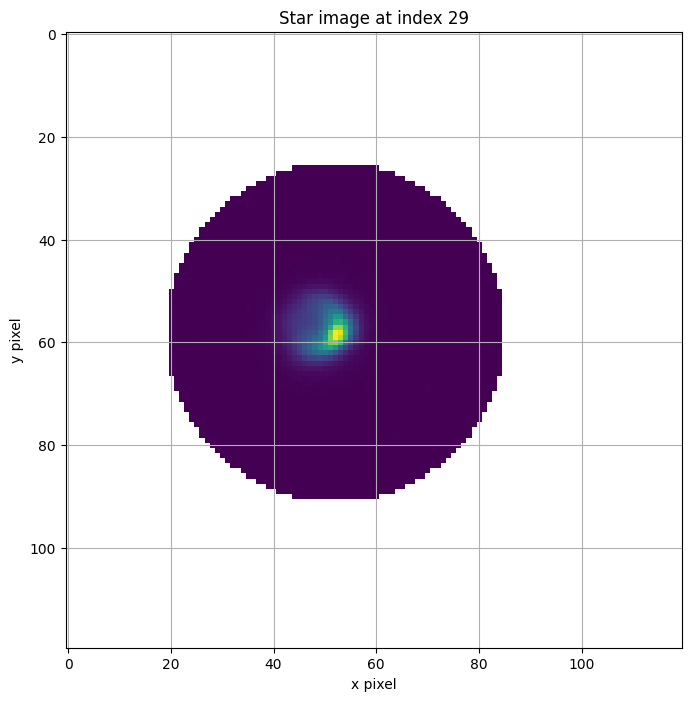

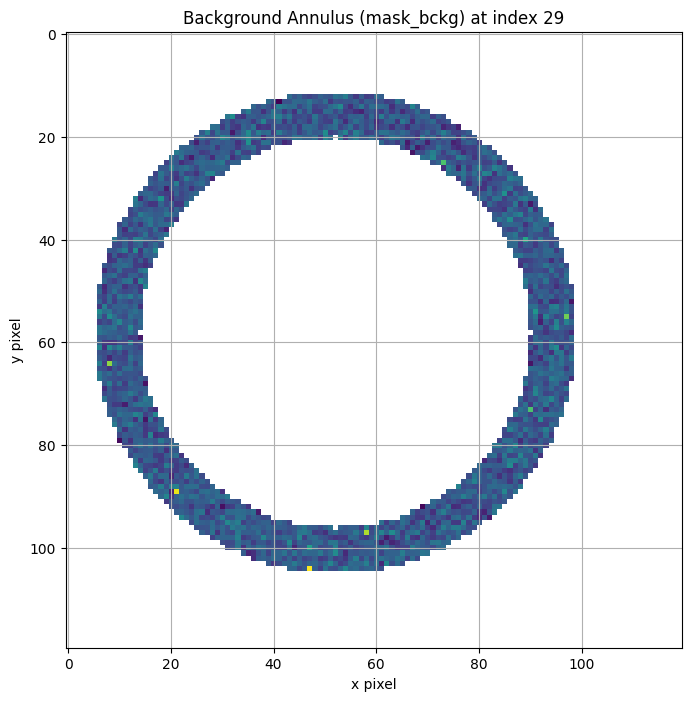

Stored flux at index 29 (unchanged): 1271932.2658952957

Index: 30
Best threshold: 14
The star flux: 1063110.5621009558
The star SNR : 757.8124445700379


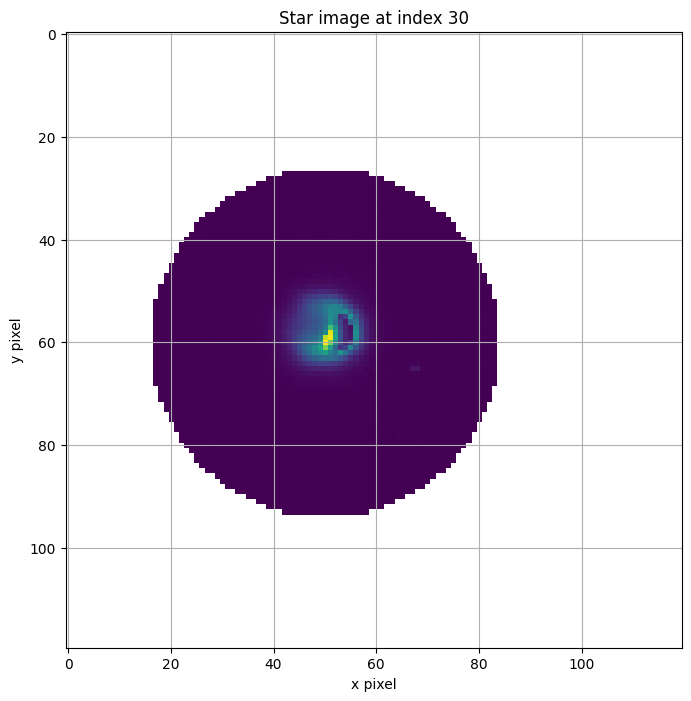

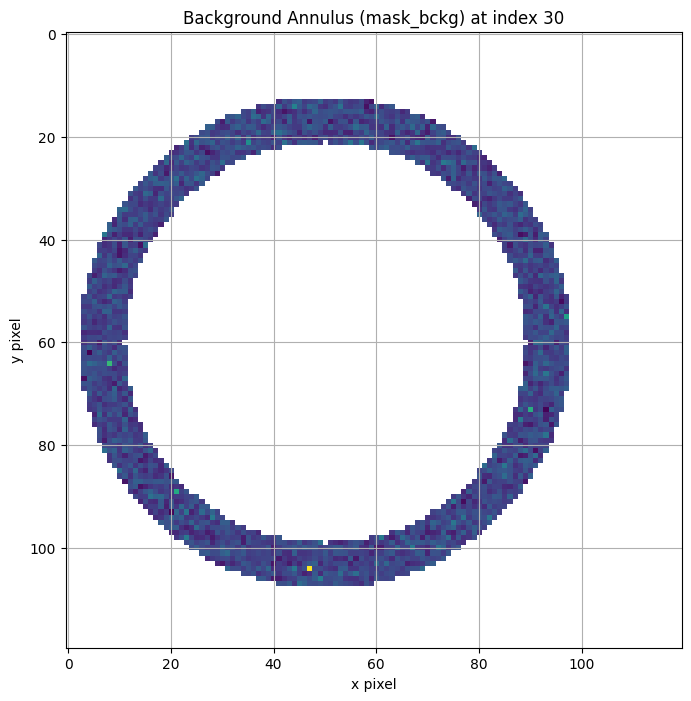

Stored flux at index 30 (unchanged): 1271932.2658952957

Index: 36
Best threshold: 13
The star flux: 1124530.3235006016
The star SNR : 799.2573777219676


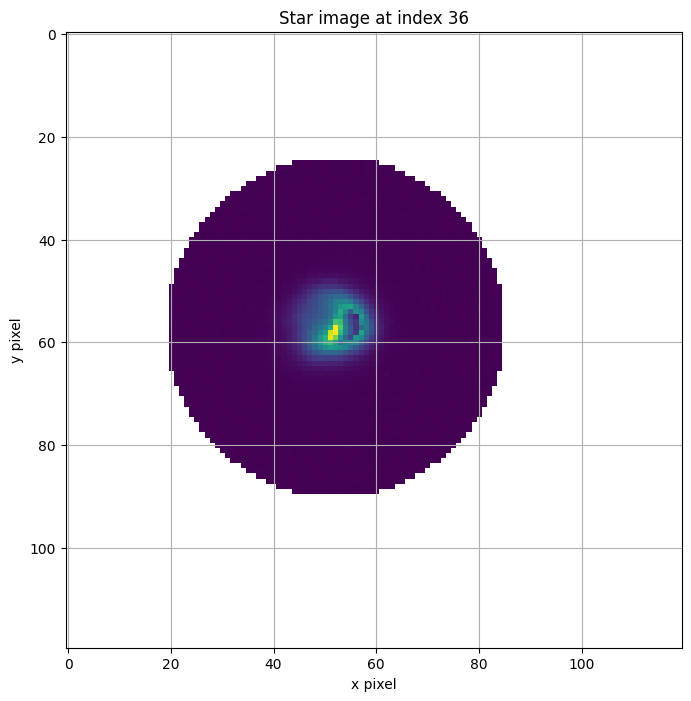

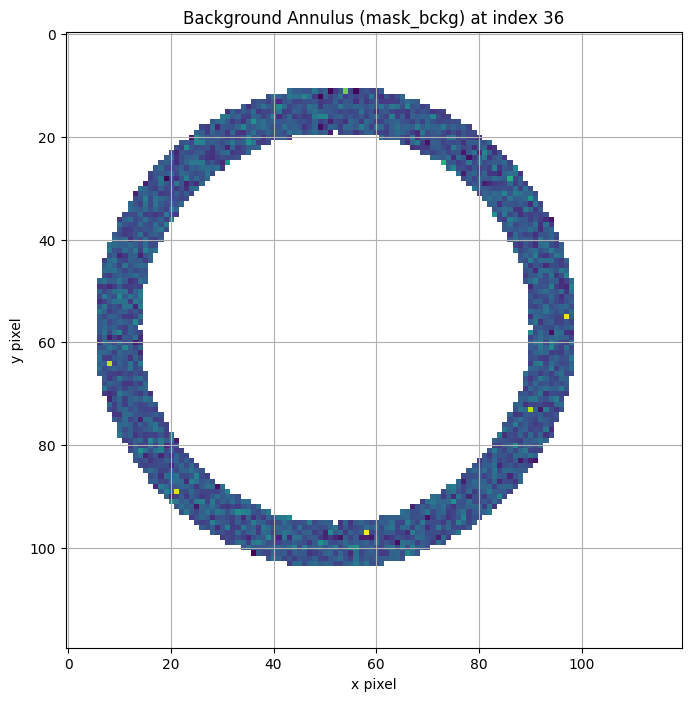

Stored flux at index 36 (unchanged): 1271932.2658952957

Index: 39
Best threshold: 13
The star flux: 1119686.4144783563
The star SNR : 791.3643049919849


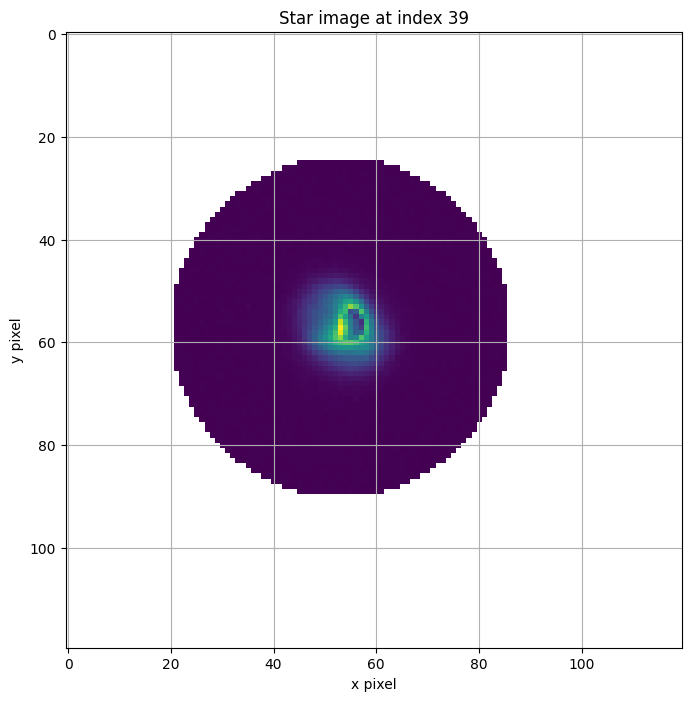

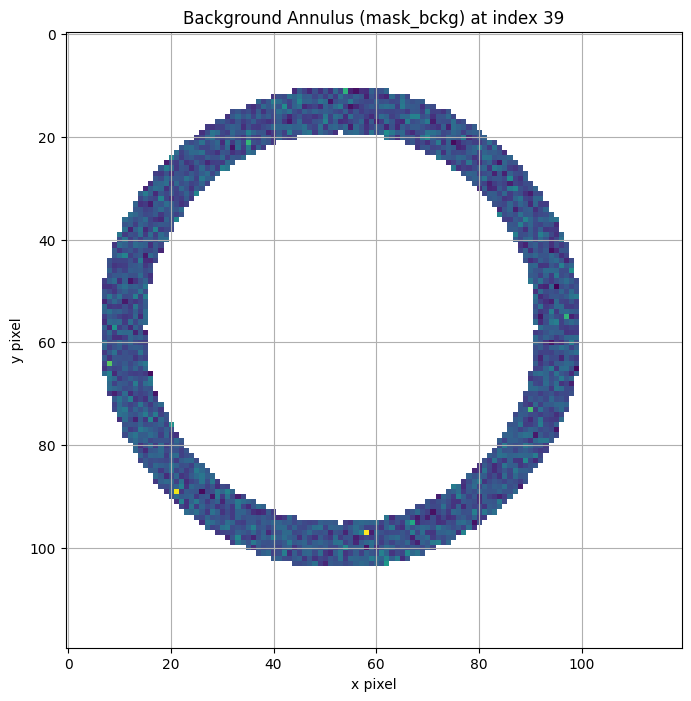

Stored flux at index 39 (unchanged): 1271932.2658952957

Index: 46
Best threshold: 13
The star flux: 979714.7449213362
The star SNR : 710.8071765381834


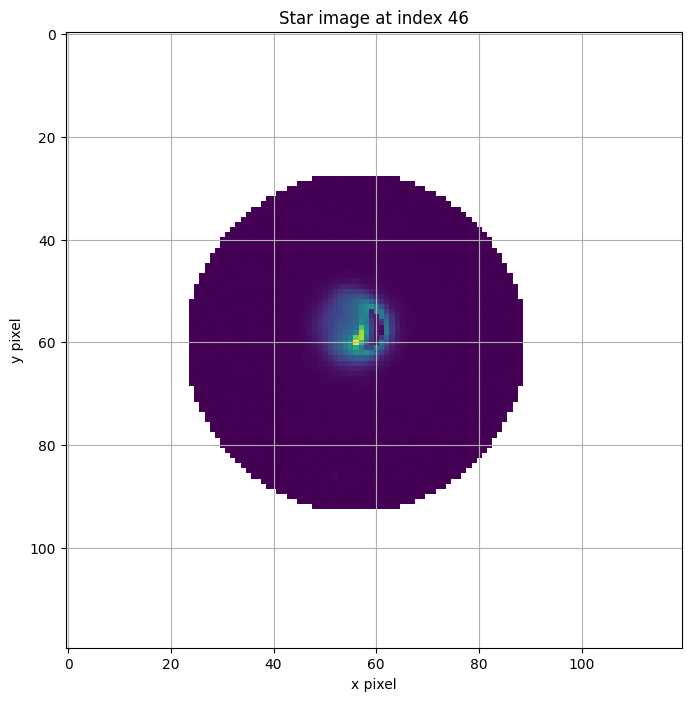

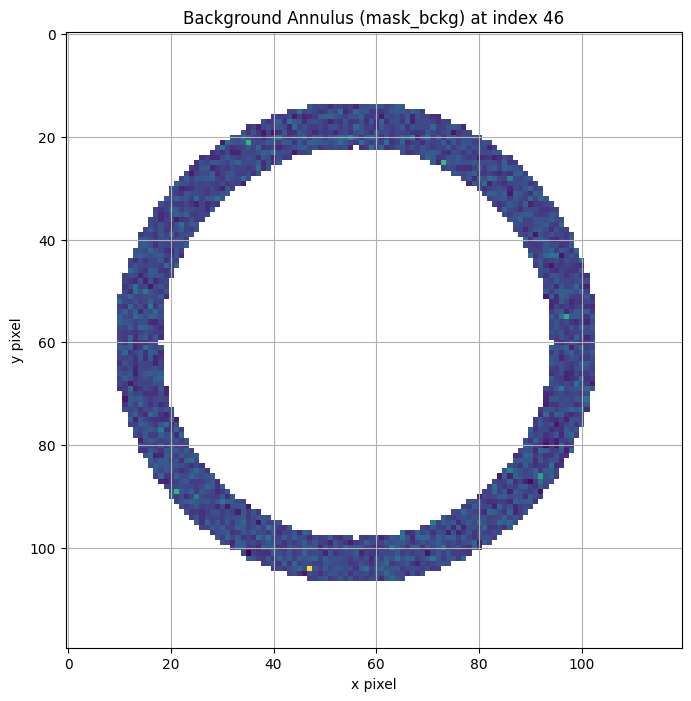

Stored flux at index 46 (unchanged): 1271932.2658952957

Index: 66
Best threshold: 13
The star flux: 1575081.851204058
The star SNR : 979.8013039429397


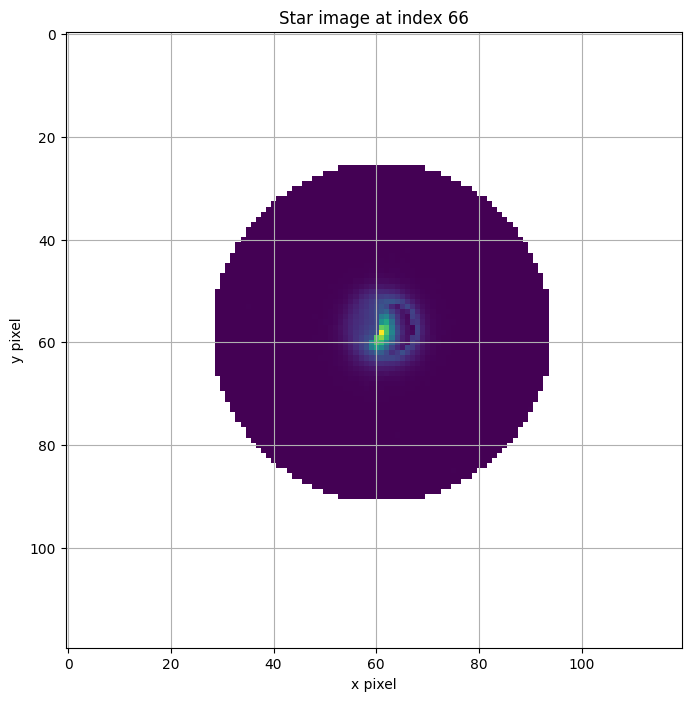

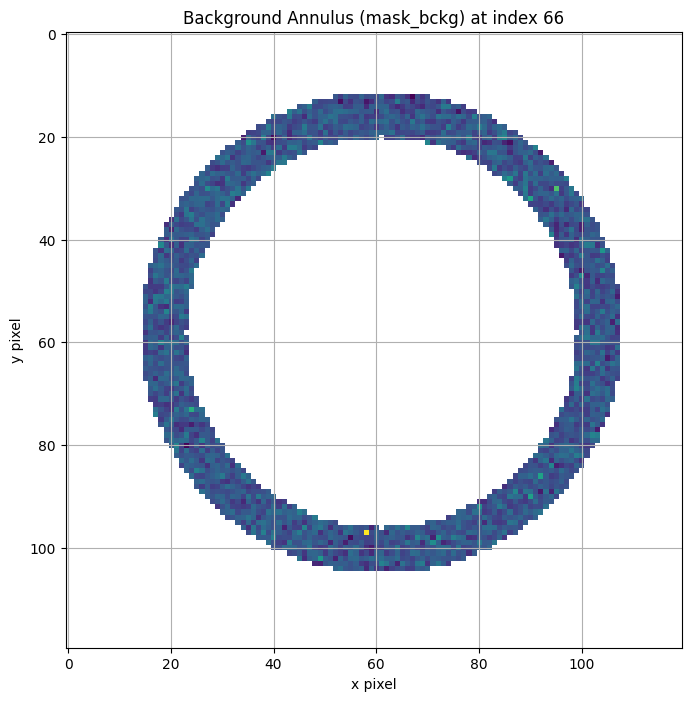

Stored flux at index 66 (unchanged): 1271932.2658952957

Index: 69
Best threshold: 13
The star flux: 1689636.2834814033
The star SNR : 1019.3118324784404


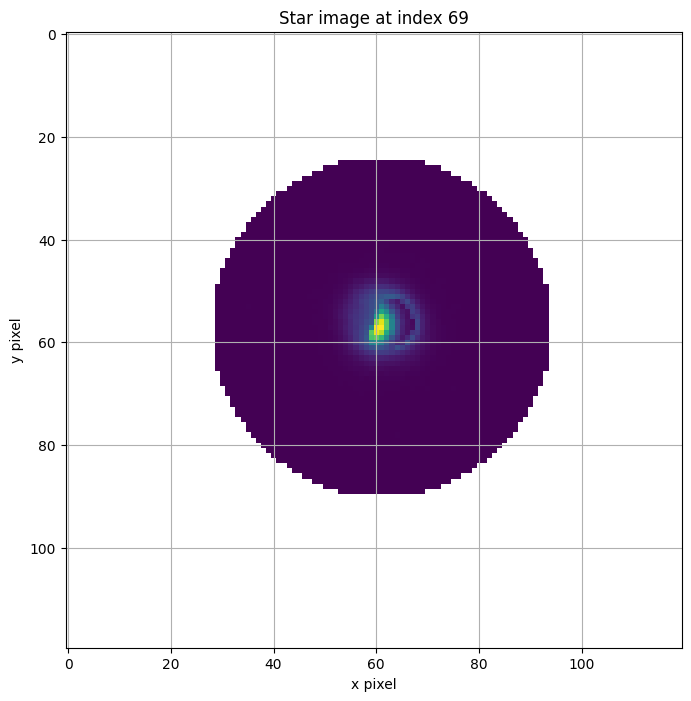

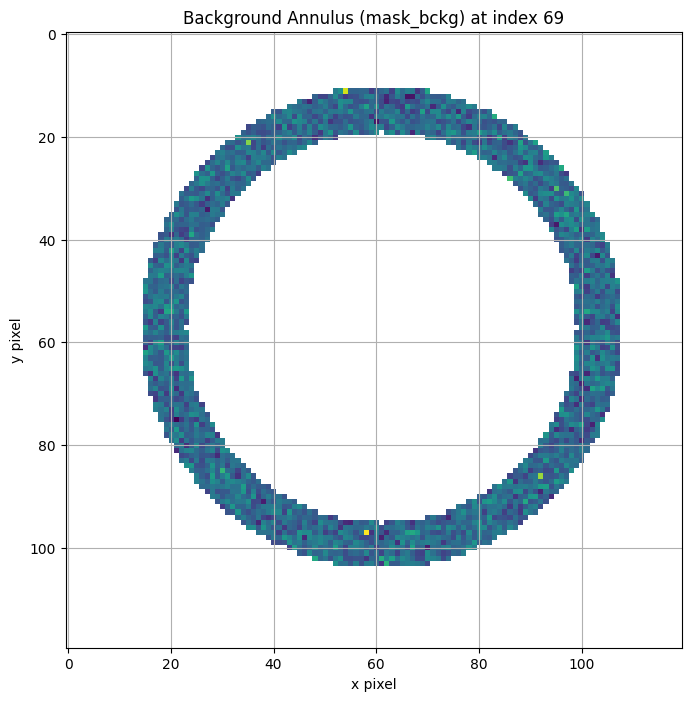

Stored flux at index 69 (unchanged): 1271932.2658952957

Index: 72
Best threshold: 13
The star flux: 1713319.7712036388
The star SNR : 1028.7461371418115


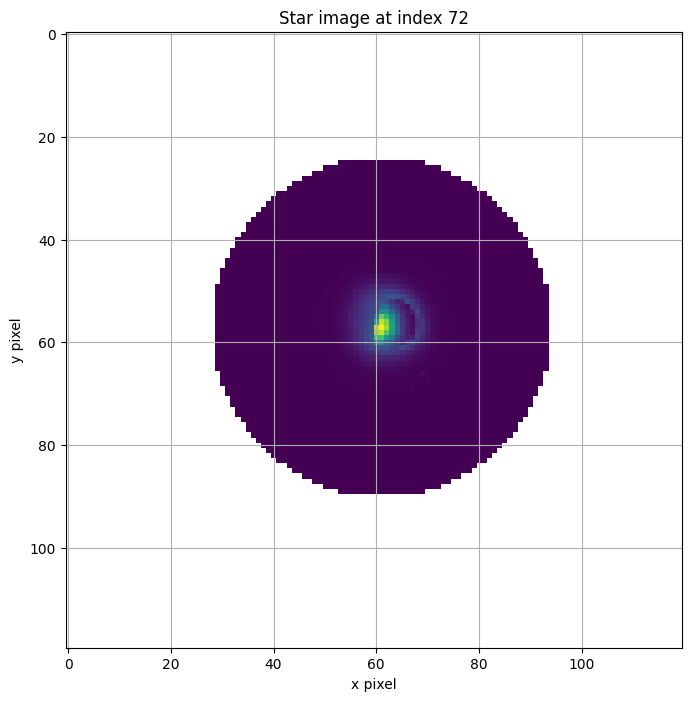

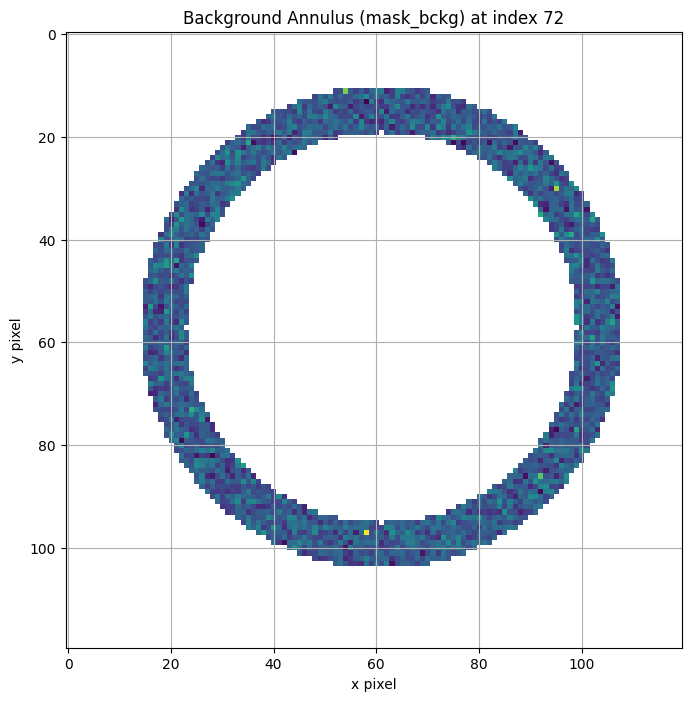

Stored flux at index 72 (unchanged): 1271932.2658952957

Index: 97
Best threshold: 13
The star flux: 1246372.8208826145
The star SNR : 767.2769684284567


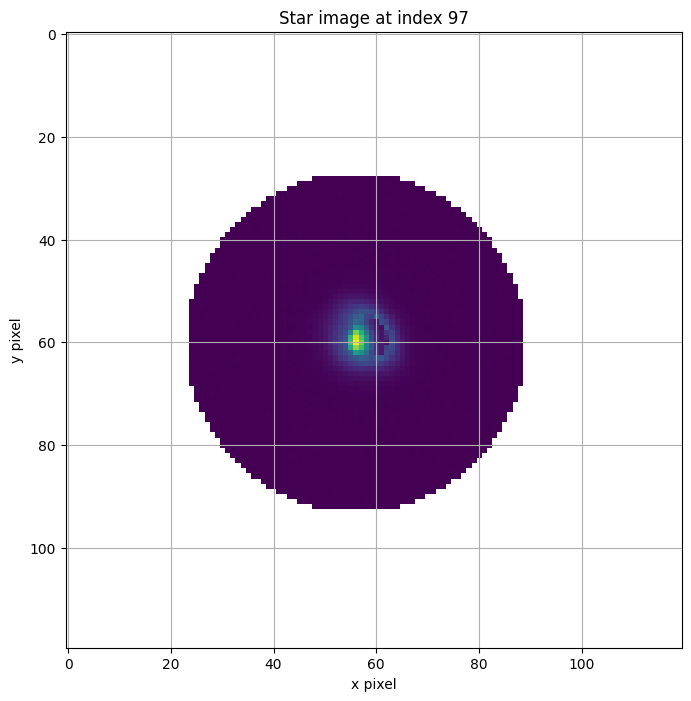

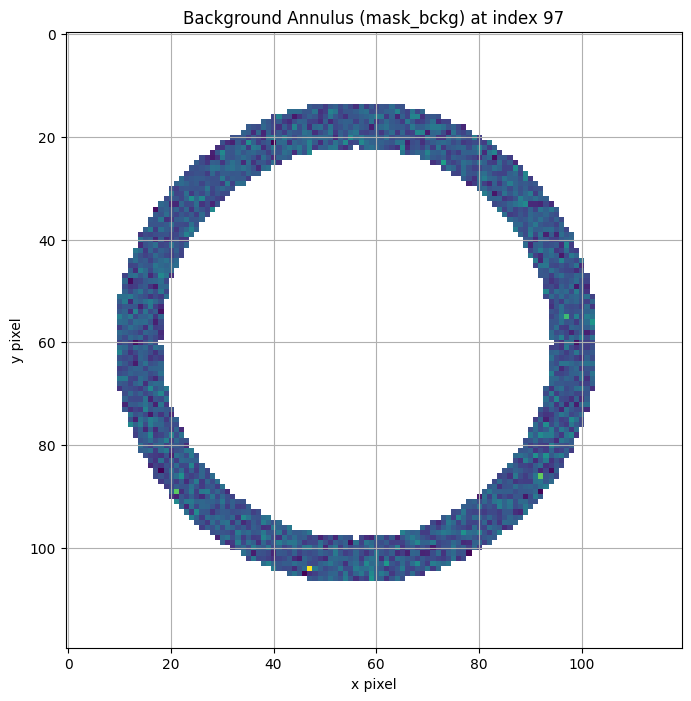

Stored flux at index 97 (unchanged): 1271932.2658952957

Index: 118
Best threshold: 13
The star flux: 1235306.772019891
The star SNR : 740.8693563526791


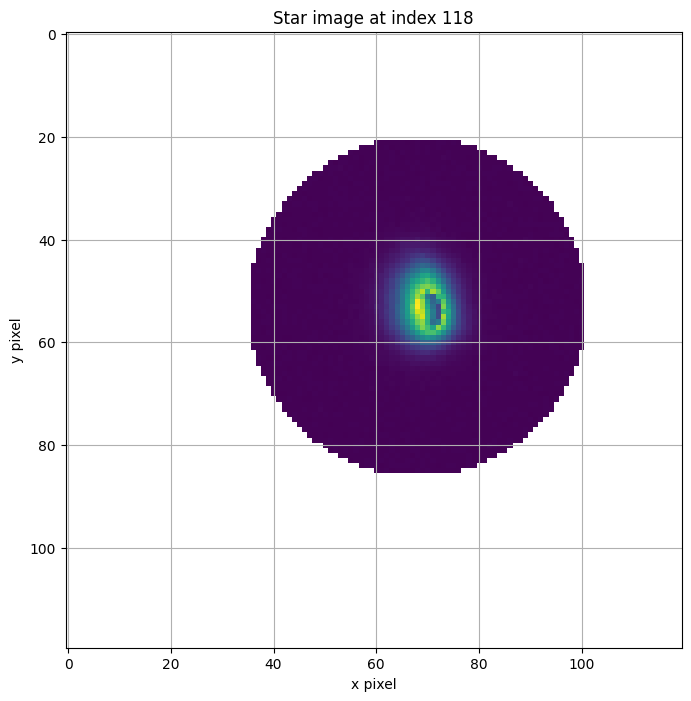

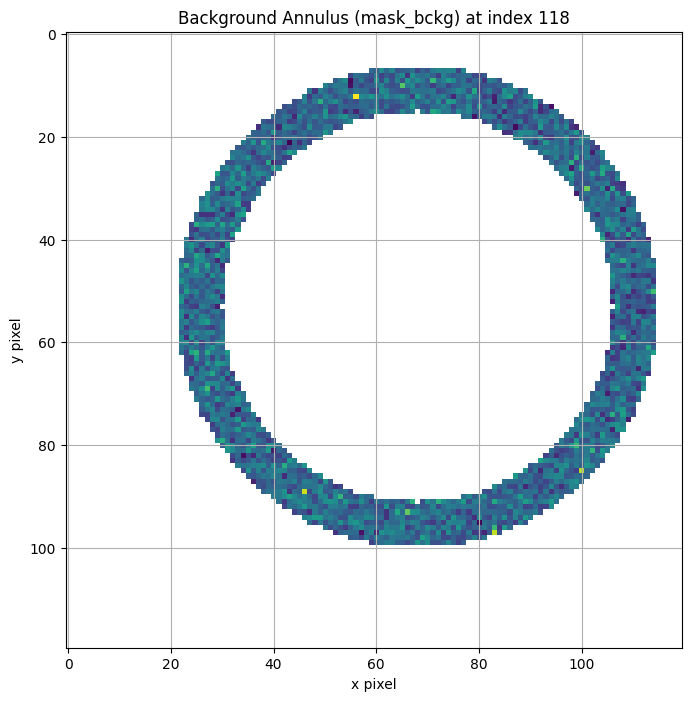

Stored flux at index 118 (unchanged): 1271932.2658952957

Index: 132
Best threshold: 13
The star flux: 1111478.806657891
The star SNR : 676.9319573085857


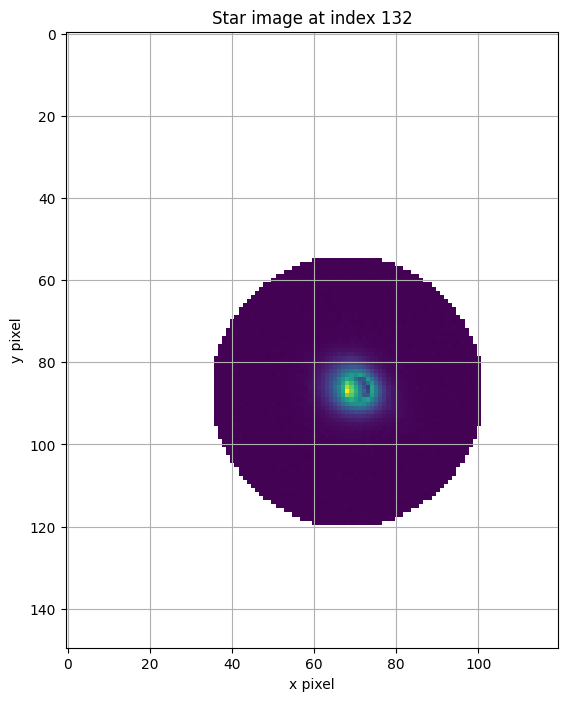

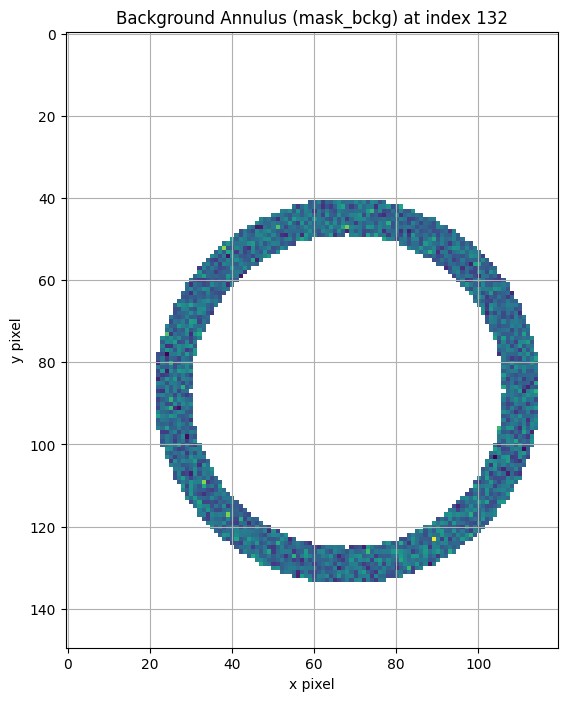

Stored flux at index 132 (unchanged): 1271932.2658952957

Index: 141
Best threshold: 13
The star flux: 1030945.2045100414
The star SNR : 593.999839474911


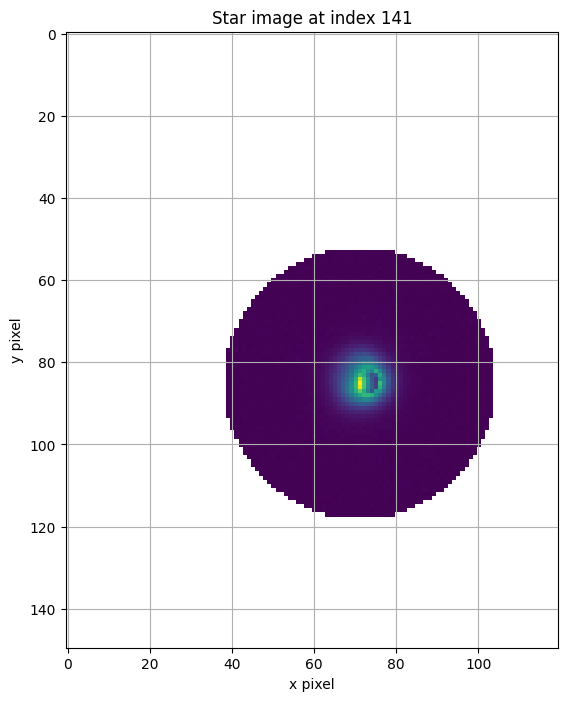

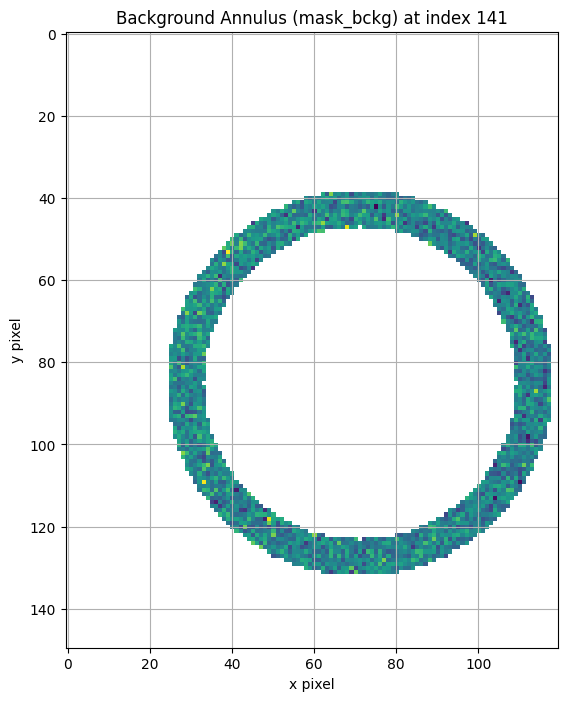

Stored flux at index 141 (unchanged): 1271932.2658952957

Index: 171
Best threshold: 13
The star flux: 1488282.1250095728
The star SNR : 778.6039006828115


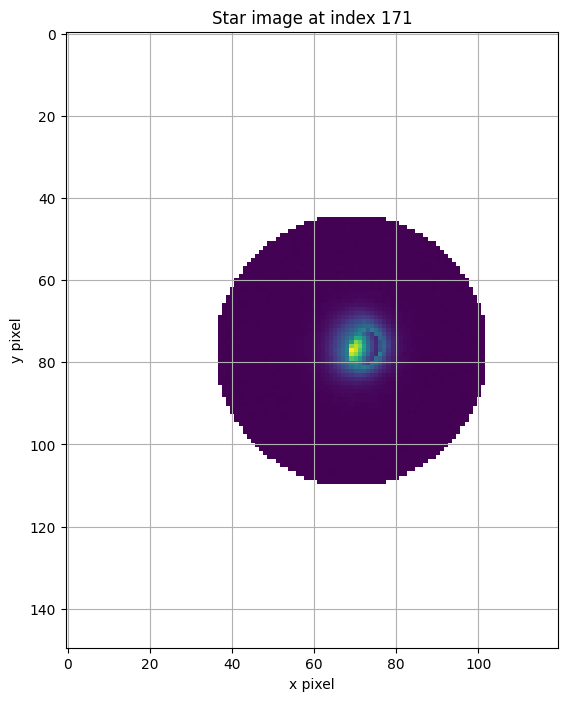

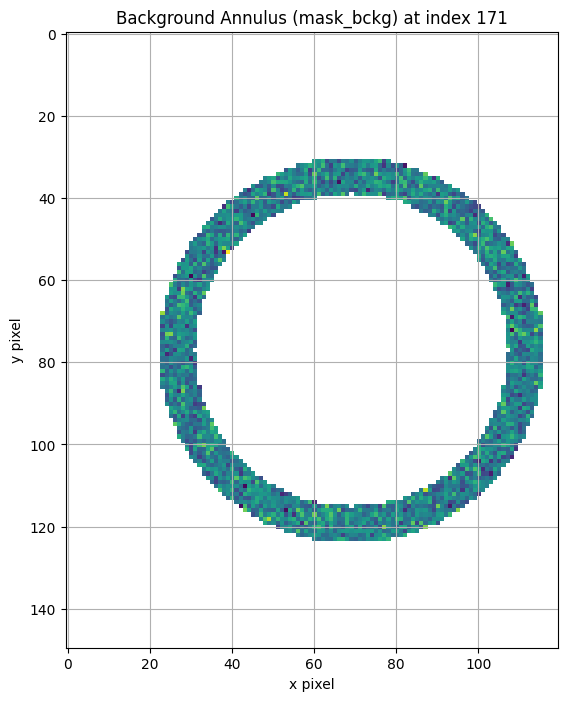

Stored flux at index 171 (unchanged): 1271932.2658952957

Index: 232
Best threshold: 22
The star flux: 605617.0546181024
The star SNR : 254.5430982284245


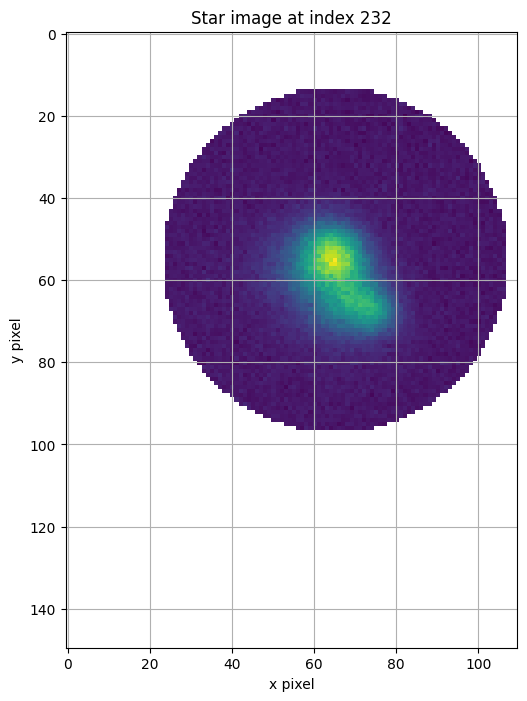

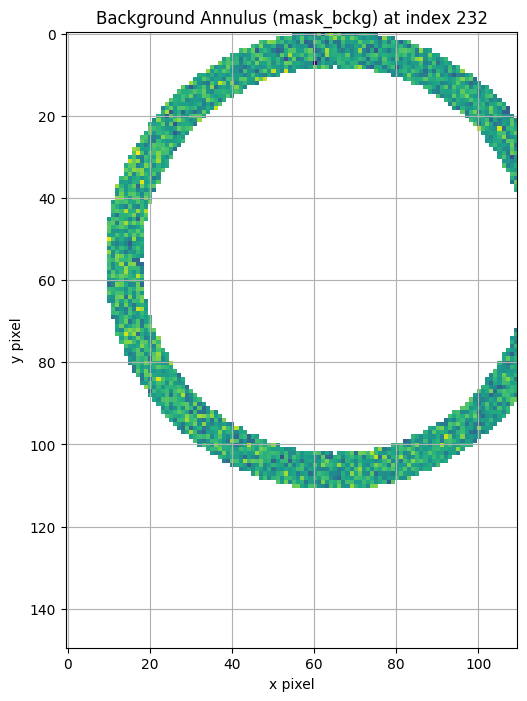

Stored flux at index 232 (unchanged): 1271932.2658952957

Index: 233
Best threshold: 13
The star flux: 622804.363861776
The star SNR : 320.15733634028044


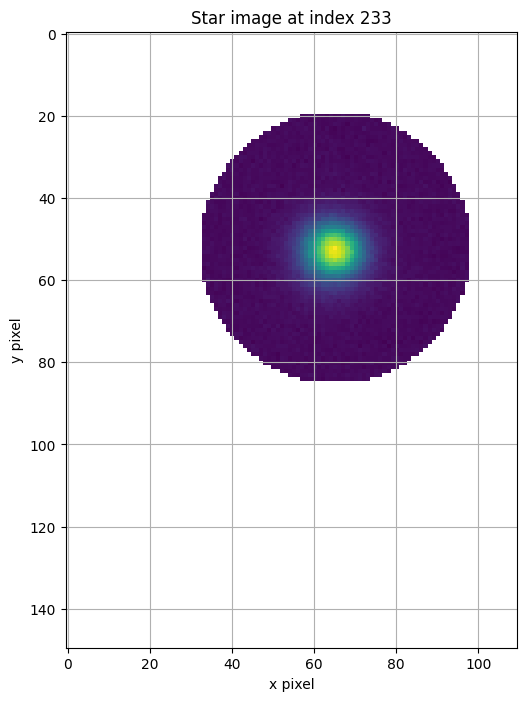

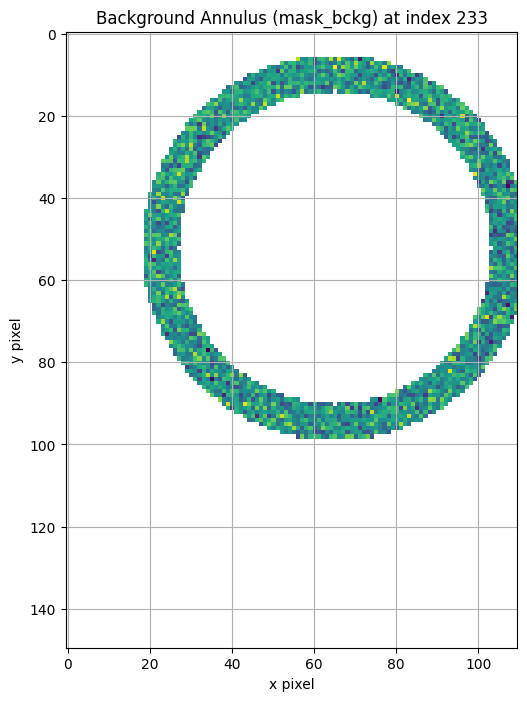

Stored flux at index 233 (unchanged): 1271932.2658952957

Index: 234
Best threshold: 13
The star flux: 656476.4013470167
The star SNR : 333.30127008657877


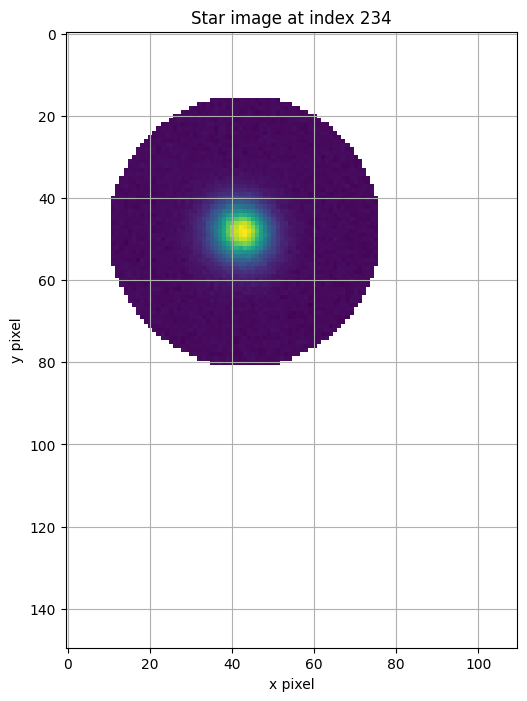

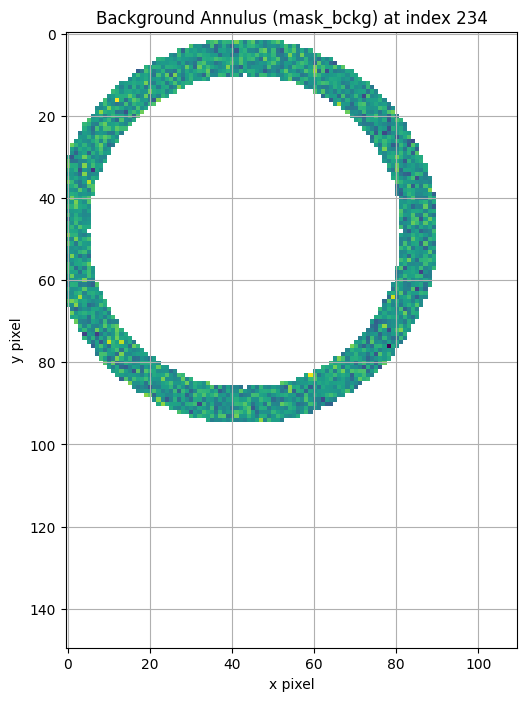

Stored flux at index 234 (unchanged): 1271932.2658952957

Index: 235
Best threshold: 17
The star flux: 682217.1309371771
The star SNR : 317.484175357708


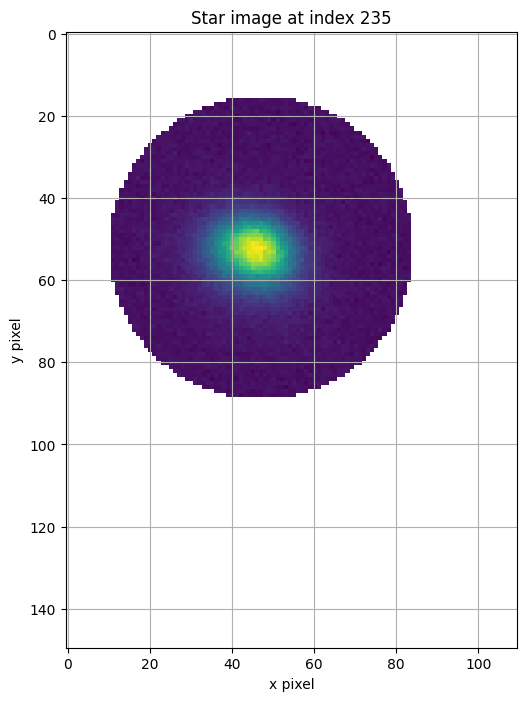

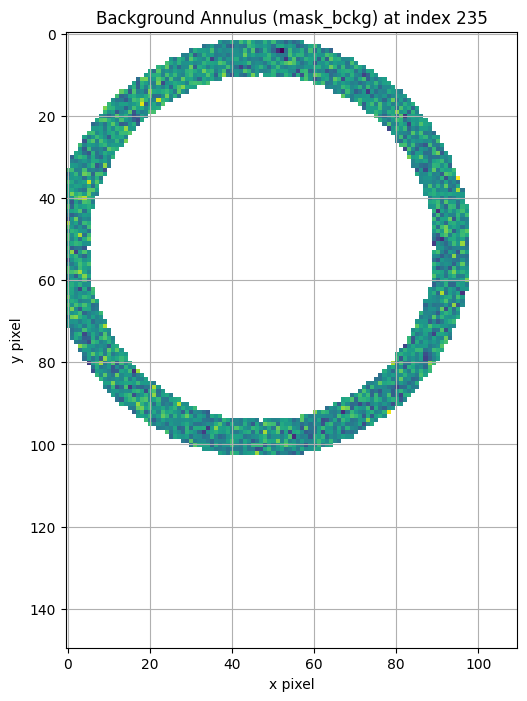

Stored flux at index 235 (unchanged): 1271932.2658952957

Index: 236
Best threshold: 13
The star flux: 711139.2511244586
The star SNR : 314.8060186515483


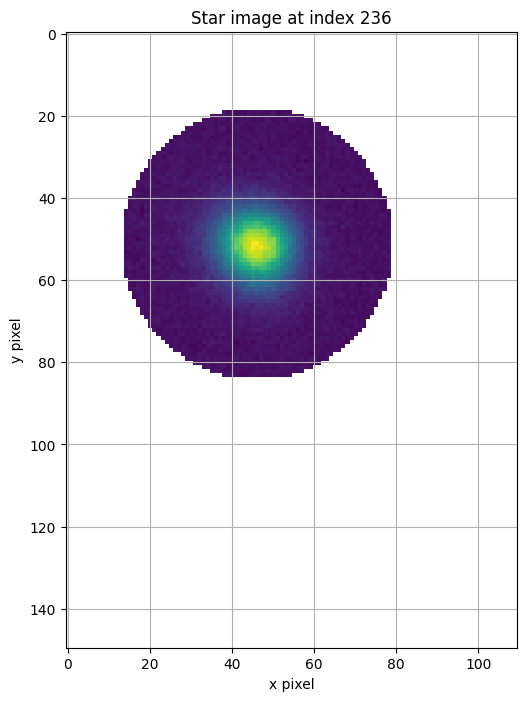

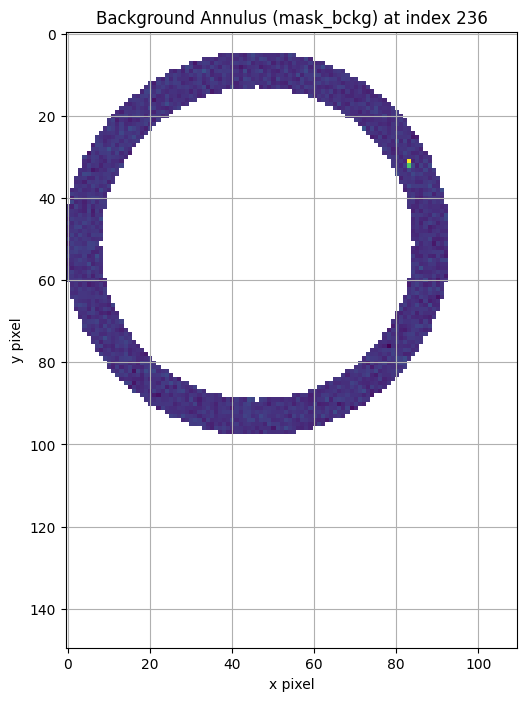

Stored flux at index 236 (unchanged): 1271932.2658952957

Index: 237
Best threshold: 34
The star flux: 782527.4464829841
The star SNR : 293.76863180479234


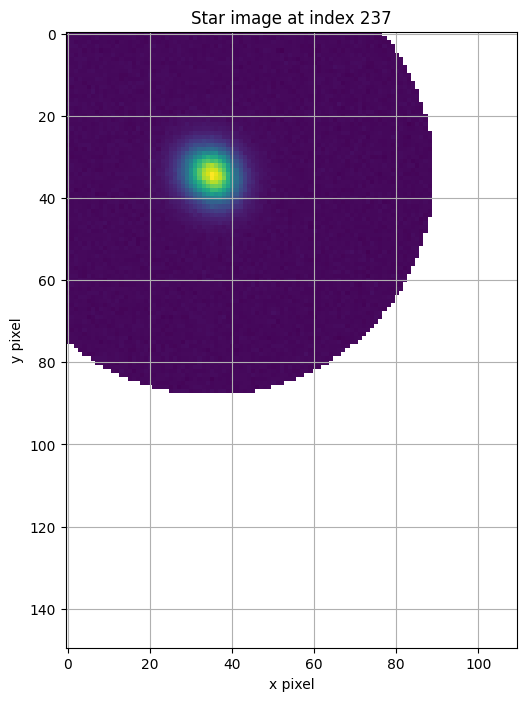

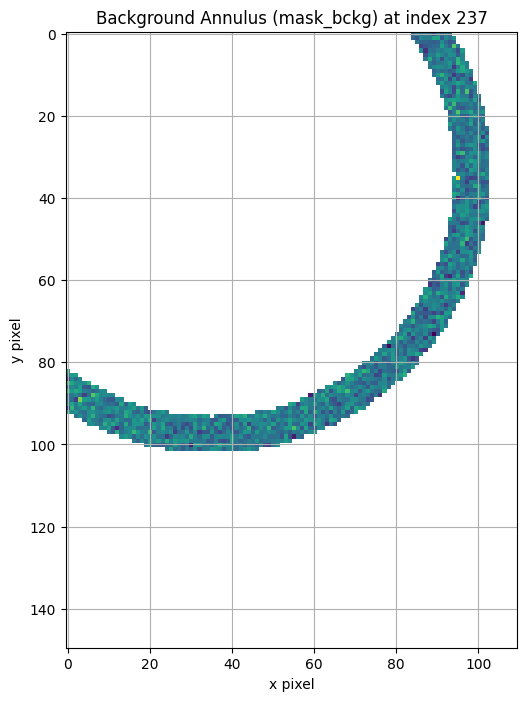

Stored flux at index 237 (unchanged): 1271932.2658952957

Index: 239
Best threshold: 38
The star flux: 738007.8400131193
The star SNR : 307.1615538196399


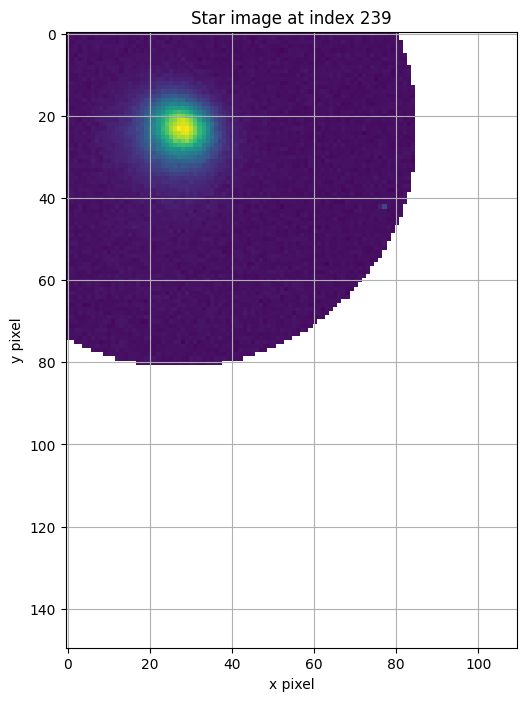

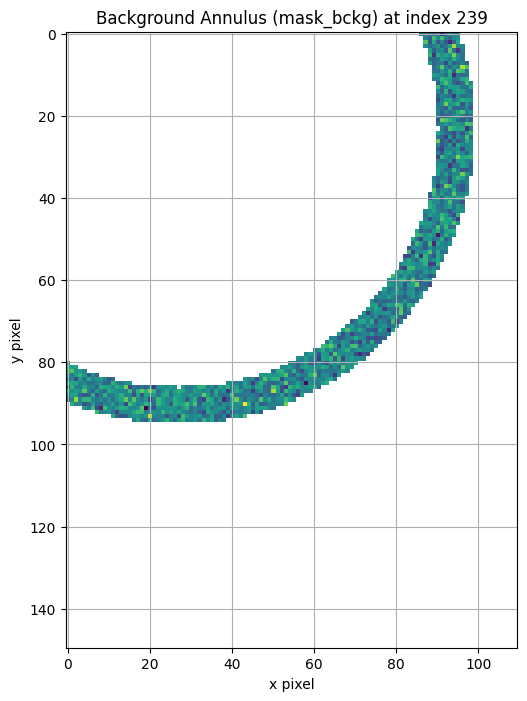

Stored flux at index 239 (unchanged): 1271932.2658952957

Index: 241
Best threshold: 16
The star flux: 792407.1554604815
The star SNR : 382.6014289709611


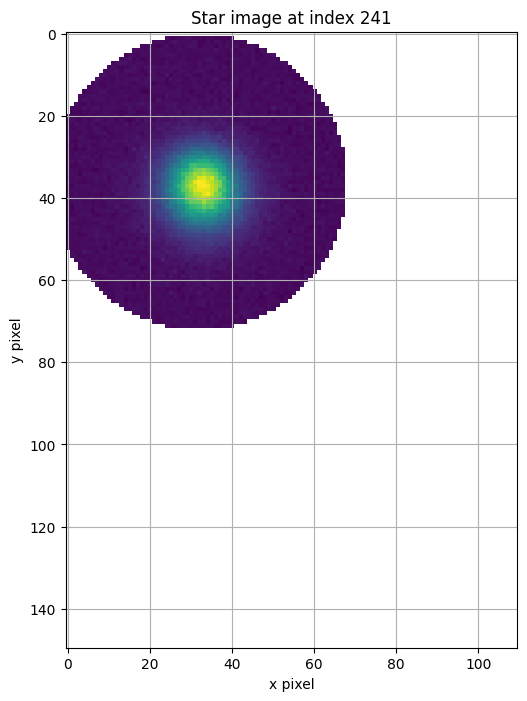

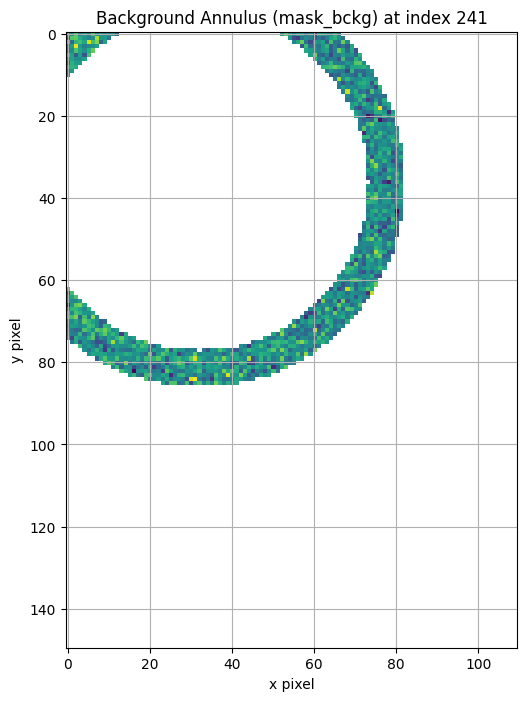

Stored flux at index 241 (unchanged): 1271932.2658952957

Index: 242
Best threshold: 35
The star flux: 816637.2982784425
The star SNR : 299.56003888891223


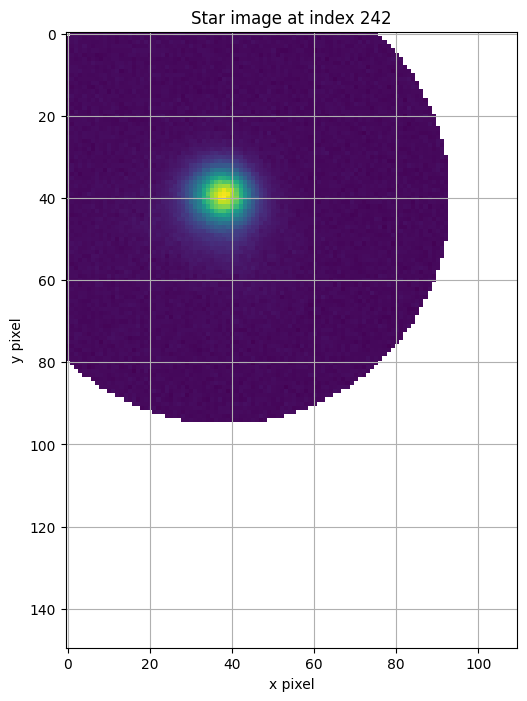

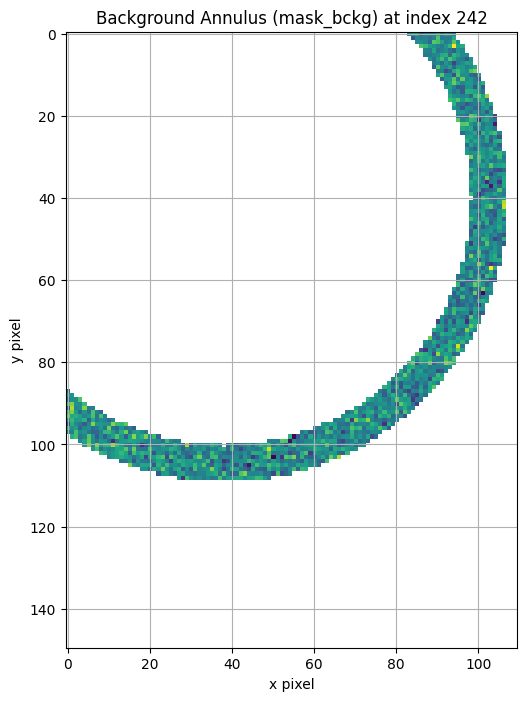

Stored flux at index 242 (unchanged): 1271932.2658952957

Index: 231
Best threshold: 14
The star flux: 632530.9391142554
The star SNR : 324.14491064992876


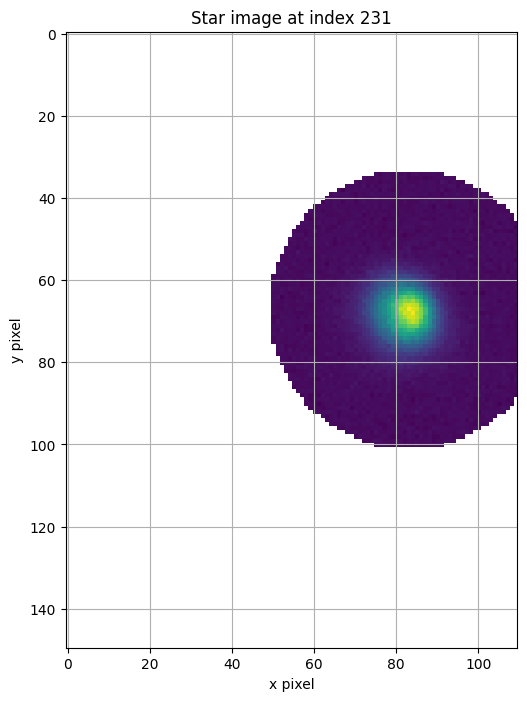

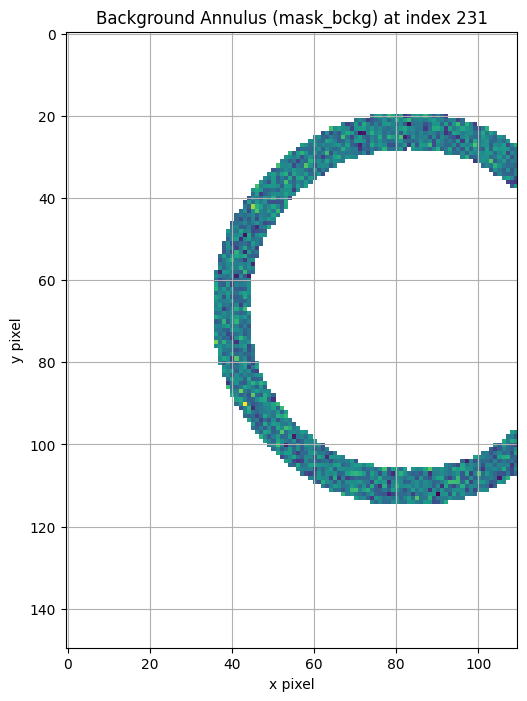

Stored flux at index 231 (unchanged): 1271932.2658952957

Index: 230
Best threshold: 13
The star flux: 650462.0468930862
The star SNR : 331.9247475919091


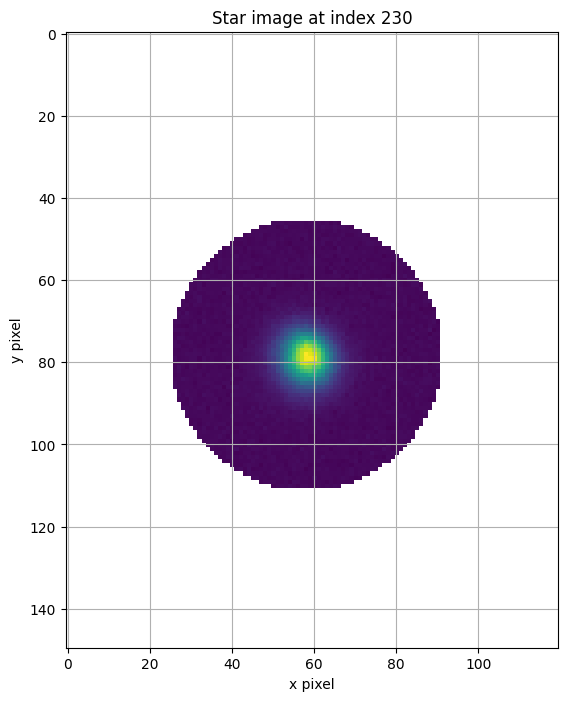

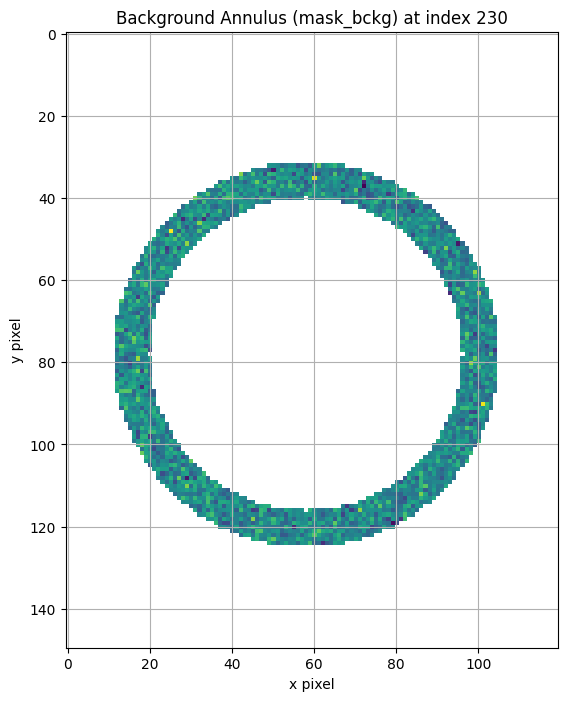

Stored flux at index 230 (unchanged): 1271932.2658952957

Index: 229
Best threshold: 13
The star flux: 687251.7170010356
The star SNR : 343.20429990138075


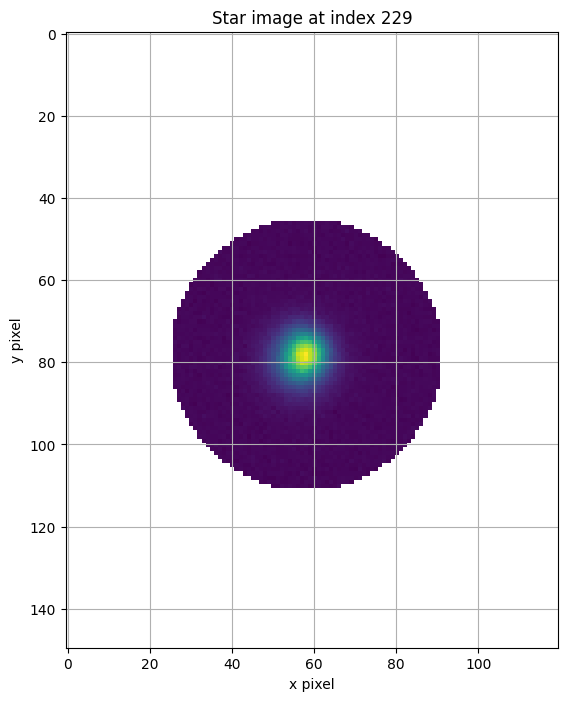

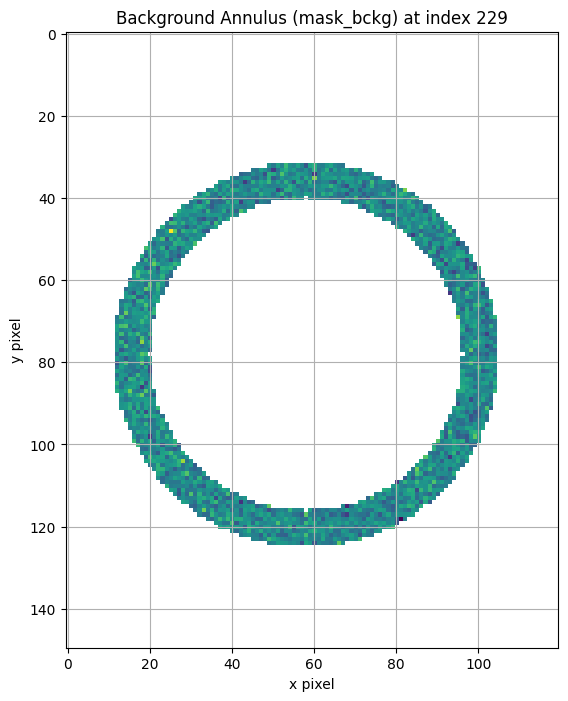

Stored flux at index 229 (unchanged): 1271932.2658952957

Index: 228
Best threshold: 17
The star flux: 673776.001771533
The star SNR : 309.4273485808081


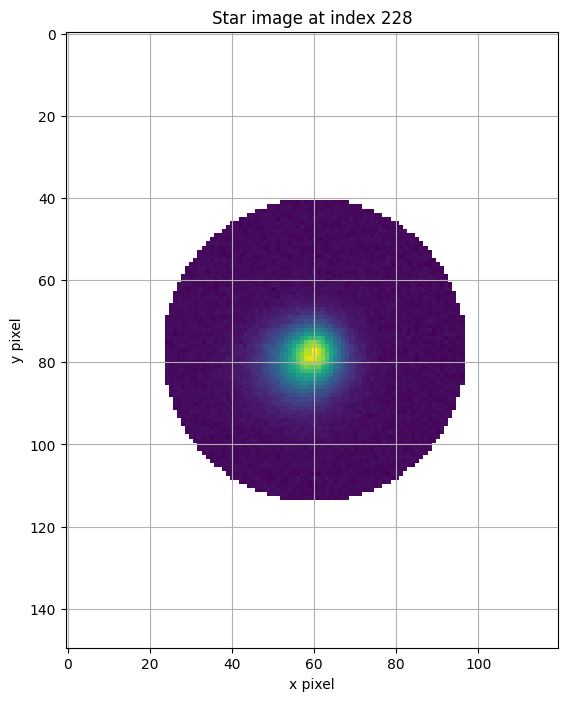

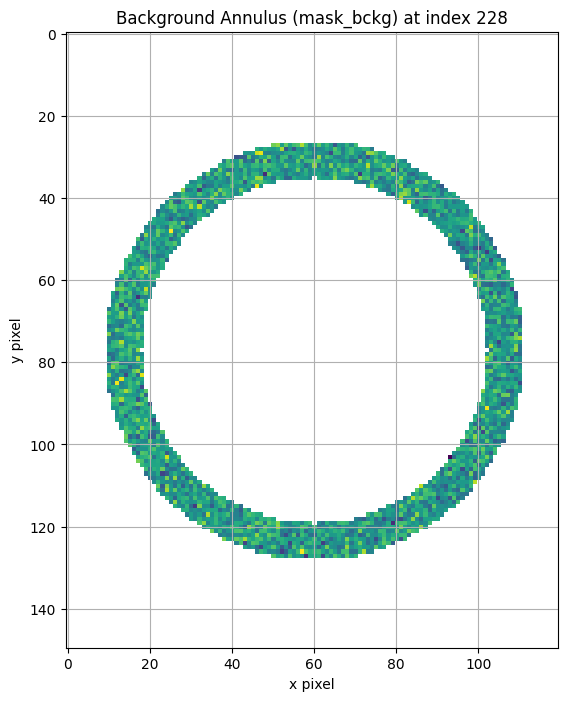

Stored flux at index 228 (unchanged): 1271932.2658952957

Index: 227
Best threshold: 28
The star flux: 686586.8677124798
The star SNR : 251.95051914771133


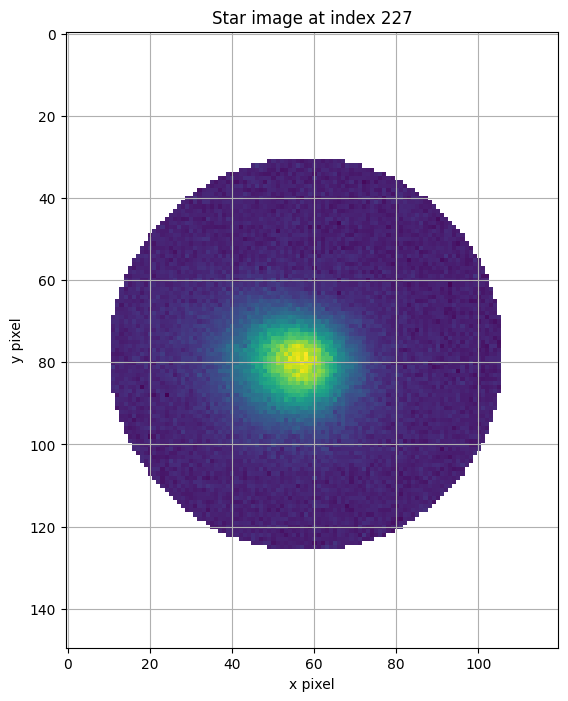

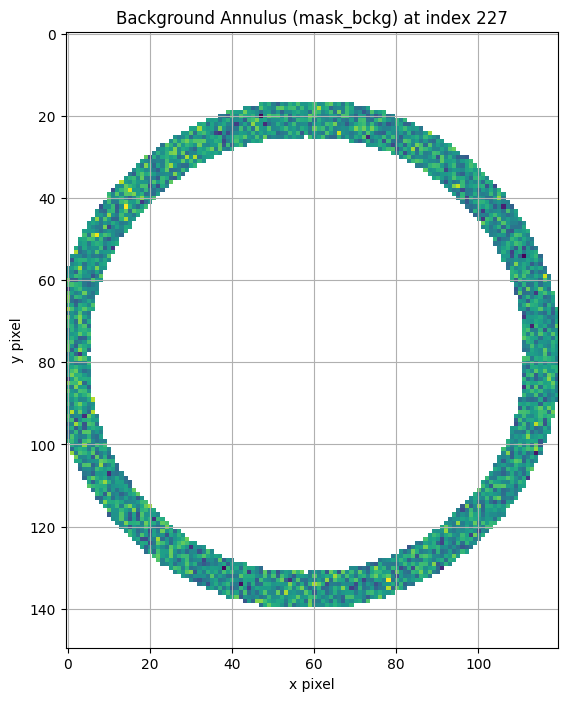

Stored flux at index 227 (unchanged): 1271932.2658952957

Index: 226
Best threshold: 13
The star flux: 738582.4042069953
The star SNR : 367.2177910995627


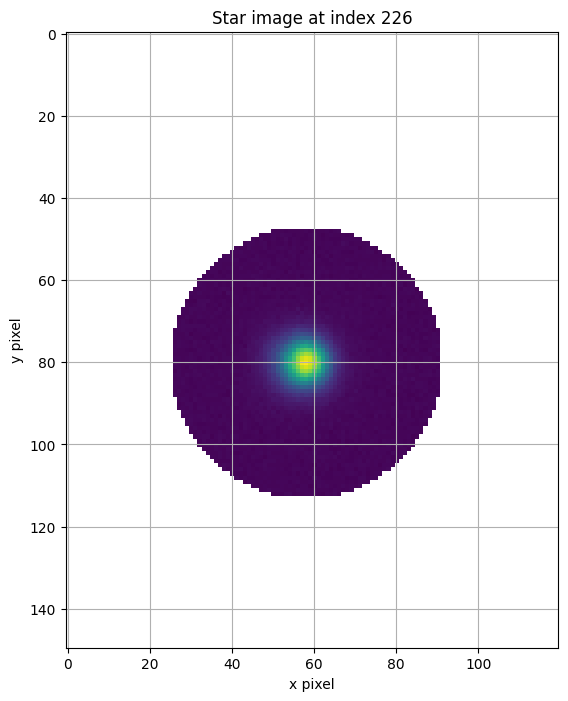

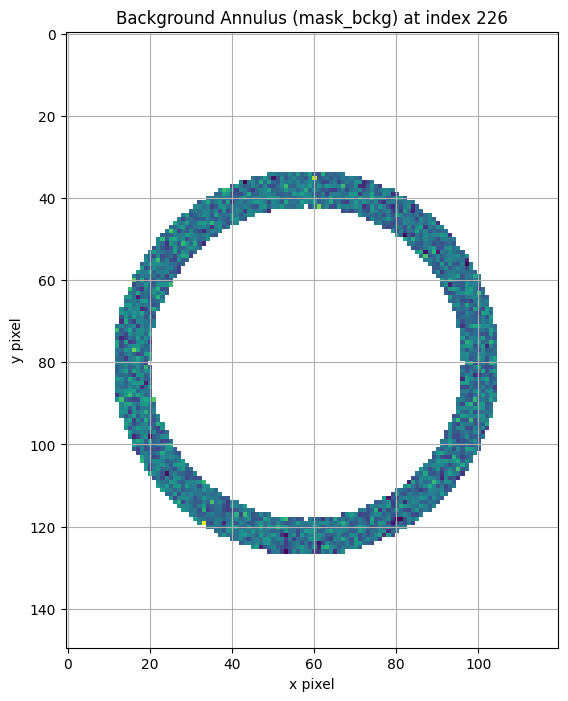

Stored flux at index 226 (unchanged): 1271932.2658952957

Index: 225
Best threshold: 13
The star flux: 719665.4306551035
The star SNR : 369.18834873406985


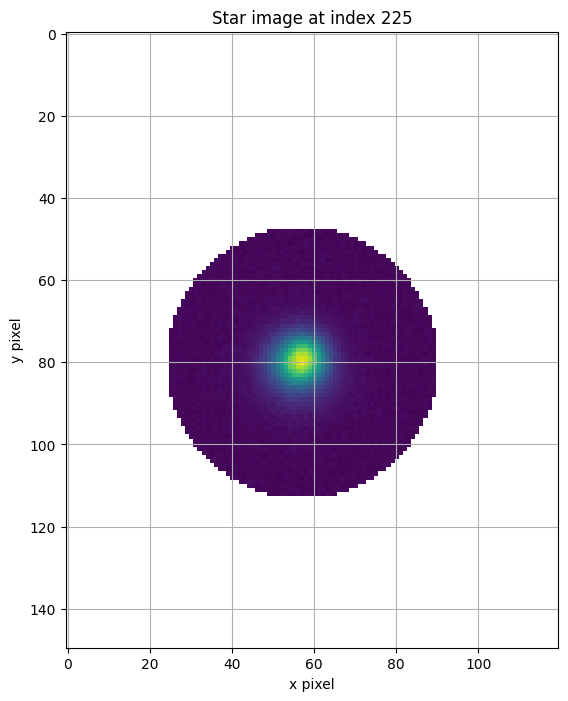

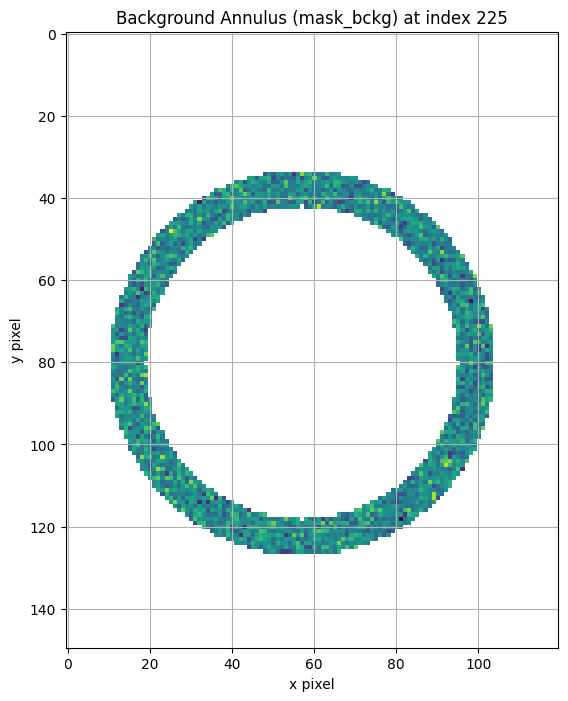

Stored flux at index 225 (unchanged): 1271932.2658952957


In [27]:
print(reg)

indices = [13+1, 23+1, 27+1, 28+1, 29+1, 35+1, 38+1, 45+1, 65+1, 68+1, 71+1, 96+1, 117+1, 131+1, 140+1,
           170+1, 231+1, 232+1, 233+1, 234+1, 235+1, 236+1, 238+1, 240+1, 242, 231, 230, 229, 228, 227, 226, 225]


for i in indices:
    if i == 30 or i == 29 or i==36 or i==39 or i==46 or i==66 or i ==69 or i==72 or i==97: 
        reg = np.s_[800:920,575:695]
    elif i == 132 or i ==141 or i==171:
        reg= np.s_[755:905,550:670]
    elif i == 232 or i == 233 or i ==234 or i ==235 or i==236 or i==232  :
        reg=np.s_[745:895, 515:625]

    elif i ==228 or i==227 or i==226 or i==225 or i==229 or i ==230:
        reg=np.s_[745:895, 550:670]
    elif i == 237 or i == 239 or i ==241 or i==242 or i==243 or i==229 or i==230 or i==231:
        reg=np.s_[745:895, 515:625]
    else:
        reg = np.s_[800:920,550:670]
    # Create Star object
    variable_star = Star(reduced_V[i], reg, sci_V[i])
    
    
    # Extract threshold values
    thr = best_thr_array[i] + 20
    thr1 = best_thr_array[i] + 25
    thr2 = best_thr_array[i] + 34
    gain = sci_V[i].header['EGAIN']
    ron = 10.0

    # Perform photometry
    variable_star.photometry(thr=thr, thr1=thr1, thr2=thr2, gain=gain, ron=ron, frame_2=sci_V[i])
    sz_lyn_lc.flux[i]=variable_star.flux
    # Print diagnostic information
    print(f"\nIndex: {i}")
    print("Best threshold:", best_thr_array[i])
    print("The star flux:", variable_star.flux)
    print("The star SNR :", variable_star.snr)

    # 2D image of the star
    plot_2d(variable_star.targ_sub, vrange=None)
    plt.title(f"Star image at index {i}")
    plt.grid(True)
    plt.show()

    # Background annulus mask visualization
    masked_bckg = np.full_like(variable_star.sub_img, np.nan)
    masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]

    plot_2d(masked_bckg, vrange=None)
    plt.title(f"Background Annulus (mask_bckg) at index {i}")
    plt.grid(True)
    plt.show()

    # Just print the original stored flux if desired
    print(f"Stored flux at index {i} (unchanged): {sz_lyn_lc.flux[14]}")

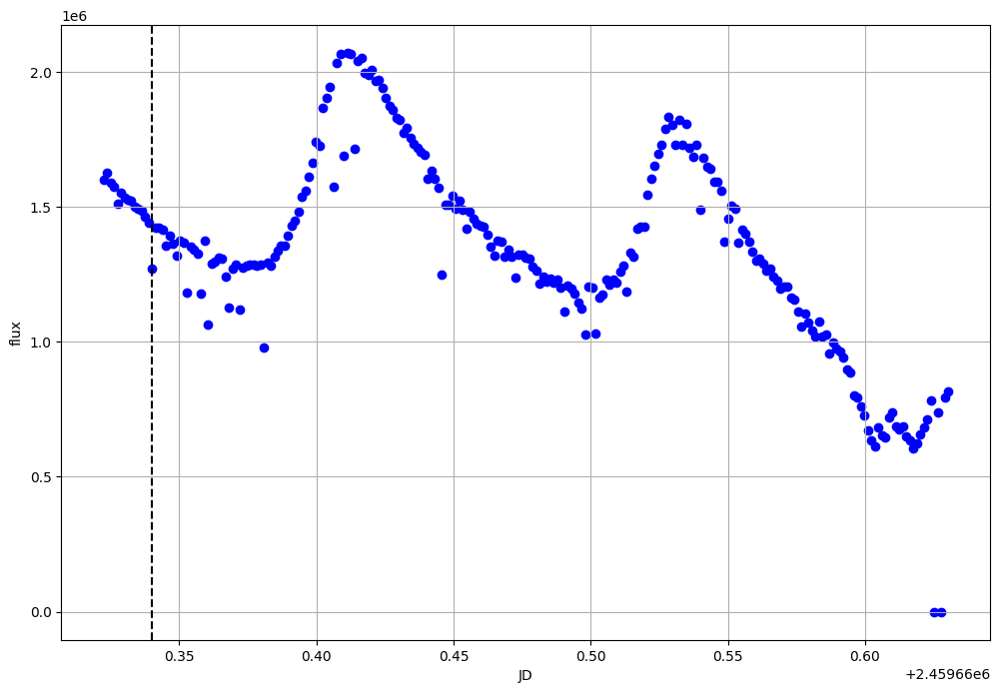

In [28]:
LightCurve.plot = plot


ax = sz_lyn_lc.plot(color='b')
ax.axvline(sz_lyn_lc.jd[14], color='BLACK', linestyle='--', label='Index 149')
ax.grid(True)

/var/folders/6y/fwk8pnpn3l1_063t_xyj4ws80000gn/T/ipykernel_9064/2697644471.py:1: RuntimeWarning: invalid value encountered in log10
  bjr_415_conv = 10.481 + 2.5*np.log10(bjr_415_lc.flux)
/var/folders/6y/fwk8pnpn3l1_063t_xyj4ws80000gn/T/ipykernel_9064/2697644471.py:2: RuntimeWarning: invalid value encountered in log10
  bjr_416_conv = 11.222 + 2.5*np.log10(bjr_416_lc.flux)


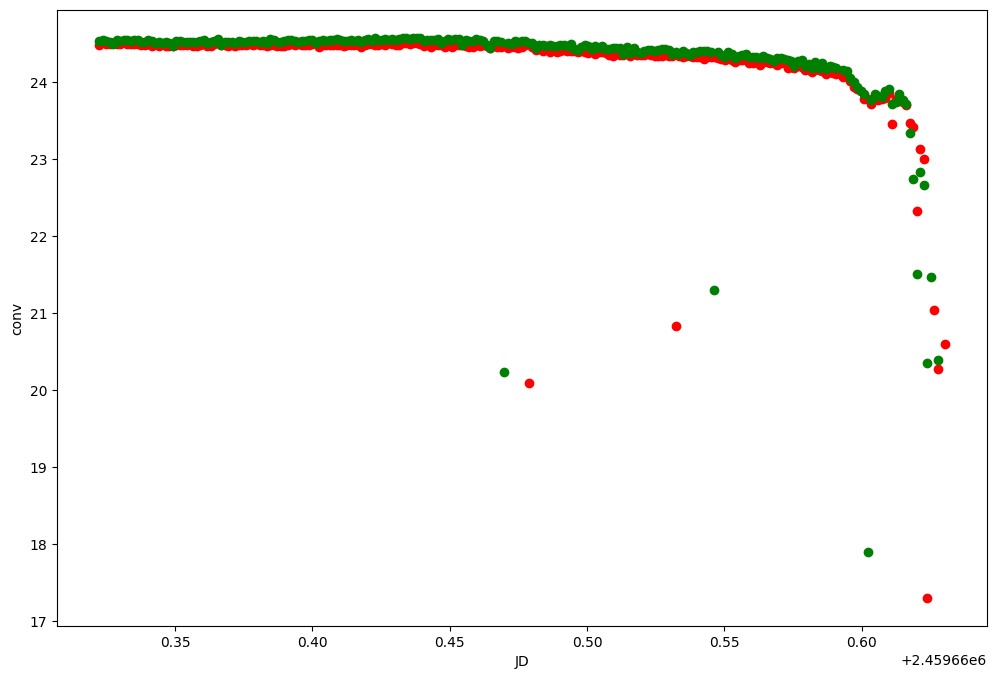

In [29]:
bjr_415_conv = 10.481 + 2.5*np.log10(bjr_415_lc.flux)
bjr_416_conv = 11.222 + 2.5*np.log10(bjr_416_lc.flux)

ax = plot_1d(bjr_415_lc.jd, bjr_415_conv, xlabel='JD', ylabel='conv', kind='scatter', color='r')
plot_1d(bjr_416_lc.jd, bjr_416_conv, xlabel='JD', ylabel='conv', kind='scatter', color='g', ax=ax)
plt.show()

/var/folders/6y/fwk8pnpn3l1_063t_xyj4ws80000gn/T/ipykernel_9064/1440920902.py:7: RuntimeWarning: invalid value encountered in log10
  self.mag = conv - 2.5*np.log10(self.flux)
/var/folders/6y/fwk8pnpn3l1_063t_xyj4ws80000gn/T/ipykernel_9064/1440920902.py:8: RuntimeWarning: invalid value encountered in sqrt
  self.mag_err = np.sqrt(conv_err**2 - (2.5/np.log(10)*self.err/self.flux)**2)


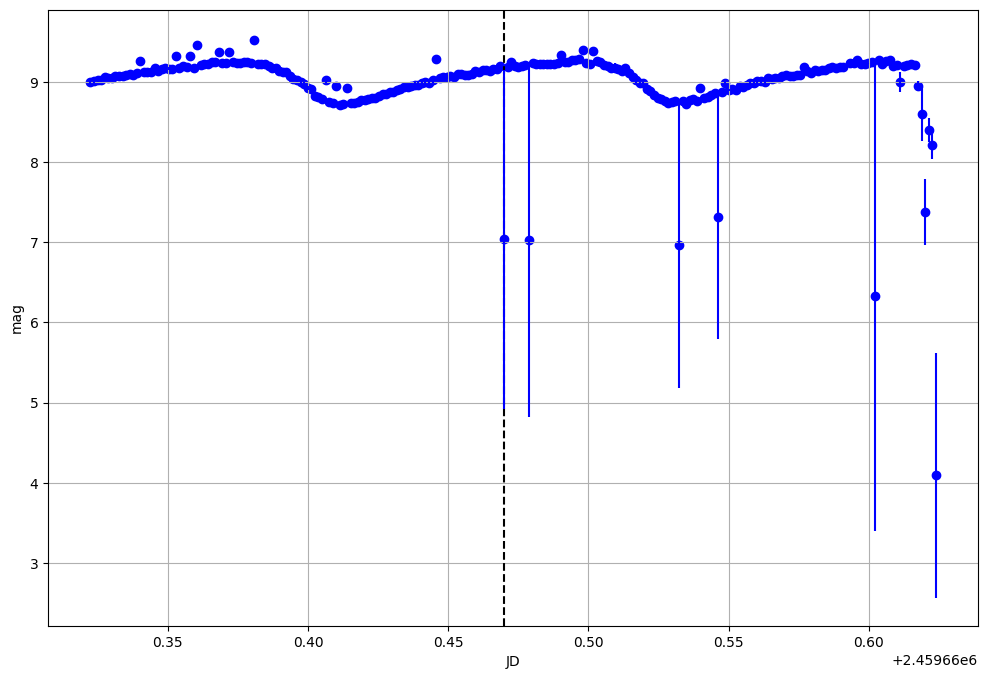

In [30]:
def mag_compute(self, conv, conv_err):  # Note that 'self' is included as the first argument
    """@brief Obtain magnitude from logarithmic fluxes, using conversion term
    @param conv Conversion term
    @param conv_err Error on conversion term
    """
    
    self.mag = conv - 2.5*np.log10(self.flux)
    self.mag_err = np.sqrt(conv_err**2 - (2.5/np.log(10)*self.err/self.flux)**2)
    
    
LightCurve.mag_compute = mag_compute

conv_mean = np.mean([bjr_415_conv, bjr_416_conv], axis=0)
conv_std = np.std([bjr_415_conv, bjr_416_conv], axis=0)

sz_lyn_lc.mag_compute(conv=conv_mean, conv_err=conv_std)
ax = sz_lyn_lc.plot(attr='mag', color='b')
ax.axvline(sz_lyn_lc.jd[116], color='BLACK', linestyle='--', label='Index 113')
ax.errorbar(sz_lyn_lc.jd, sz_lyn_lc.mag, yerr=sz_lyn_lc.mag_err, fmt='none', color='b')
plt.grid(True)
plt.show()

In [31]:
sz_lyn_lc.mag_err[116]

2.11666467185656

# THE ERRORS ON THE LIGHT CURVE DUE TO THE LIGHT CURVE DUE TO LC OF THE STARS!

THE FIRST ONE IS DUE TO BJR 416 let's see first how BJR 415 first works 

(slice(550, 670, None), slice(480, 600, None))


13
The star flux
401388.70758196997
The star SNR
291.2688972463157


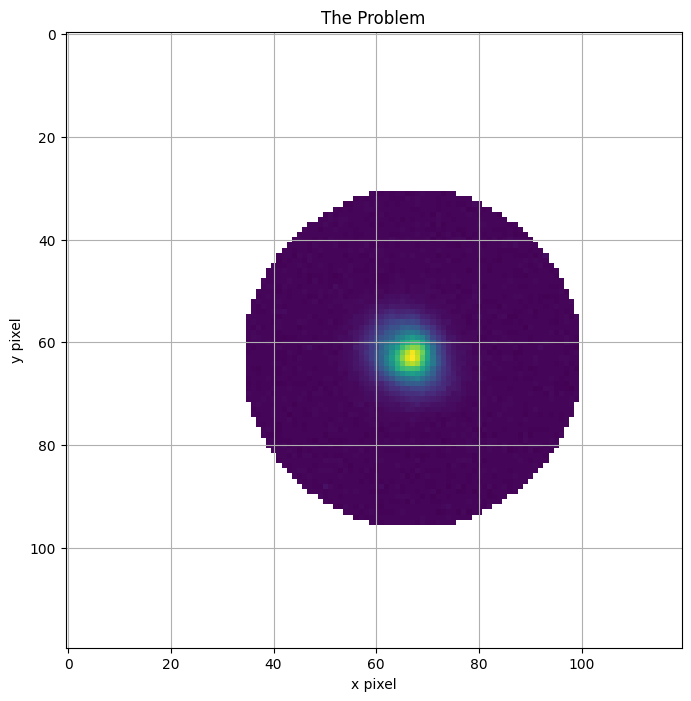

1340236.8465212544


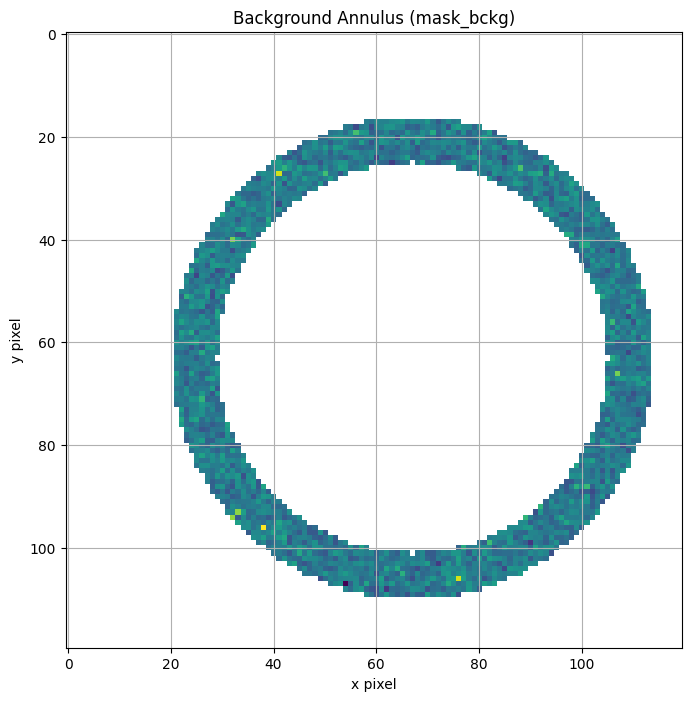

18
The star flux
396596.50975247496
The star SNR
253.81939267114902


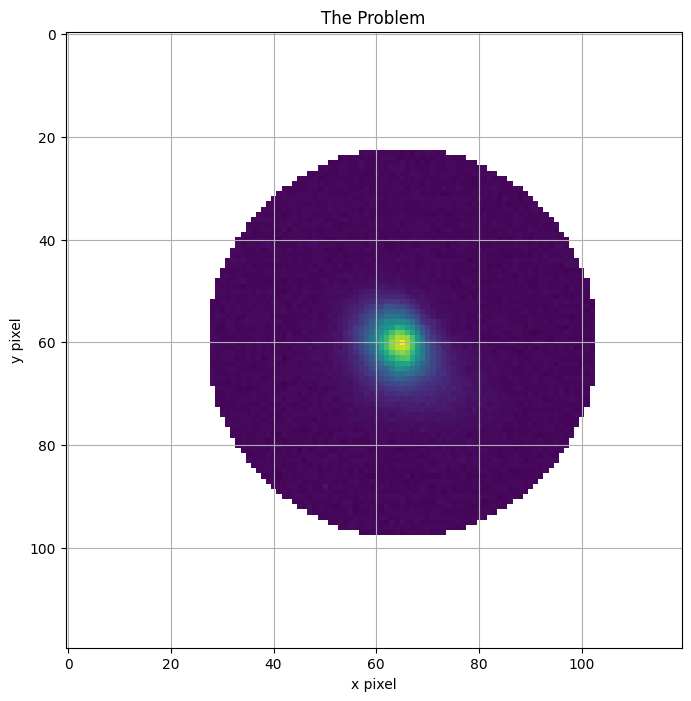

1315919.4296467481


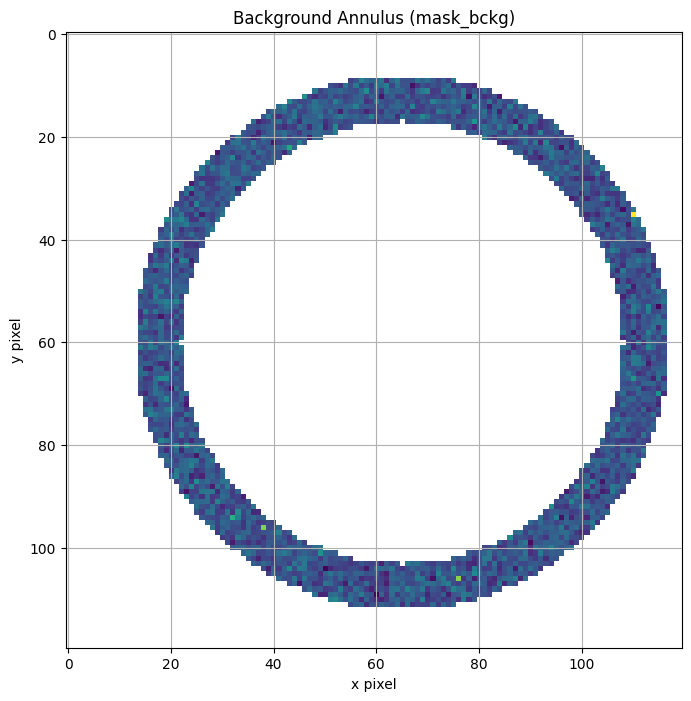

In [63]:
i=116
variable_star = Star(reduced_V[i], region_bjr_415, sci_V[i])

variable_star.photometry(thr=best_thr_array[i]+20, thr1=best_thr_array[i]+25, thr2=best_thr_array[i]+34, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
print(best_thr_array[i])

print("The star flux")
print(variable_star.flux)
print("The star SNR")
print(variable_star.snr)
#997524.0791596372
#904.0473818662686

#sz_lyn_lc.snr[14]=variable_star.snr
#best_background_min[14]=thr1
#best_background_max[14]=thr2

#print(variable_star.snr)

plot_2d(variable_star.targ_sub, vrange=None)
plt.title("The Problem")
plt.grid('True')
plt.show()
#sz_lyn_lc.flux[14]=variable_star.flux
#1265836.5739887592
#1268466.2813722242
#1269288.1833080759
print(sz_lyn_lc.flux[i])
##The one before has 1366785.4760777184
masked_bckg = np.full_like(variable_star.sub_img, np.nan)
masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]
plot_2d(masked_bckg, vrange=None)
plt.title("Background Annulus (mask_bckg)")
plt.grid('True')
plt.show()
i=117
variable_star = Star(reduced_V[i], region_bjr_415, sci_V[i])
variable_star.photometry(thr=best_thr_array[i]+20, thr1=best_thr_array[i]+25, thr2=best_thr_array[i]+34, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
print(best_thr_array[i])

print("The star flux")
print(variable_star.flux)
print("The star SNR")
print(variable_star.snr)
#997524.0791596372
#904.0473818662686

#sz_lyn_lc.snr[14]=variable_star.snr
#best_background_min[14]=thr1
#best_background_max[14]=thr2

#print(variable_star.snr)

plot_2d(variable_star.targ_sub, vrange=None)
plt.title("The Problem")
plt.grid('True')
plt.show()
#sz_lyn_lc.flux[14]=variable_star.flux
#1265836.5739887592
#1268466.2813722242
#1269288.1833080759
print(sz_lyn_lc.flux[i])
##The one before has 1366785.4760777184
masked_bckg = np.full_like(variable_star.sub_img, np.nan)
masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]
plot_2d(masked_bckg, vrange=None)
plt.title("Background Annulus (mask_bckg)")
plt.grid('True')
plt.show()
#401388.70758196997



As we can see there is no problem it is as exoected and the region is where we expect to find it!

13
The star flux
209807.38169018243
The star SNR
307.21290539048516


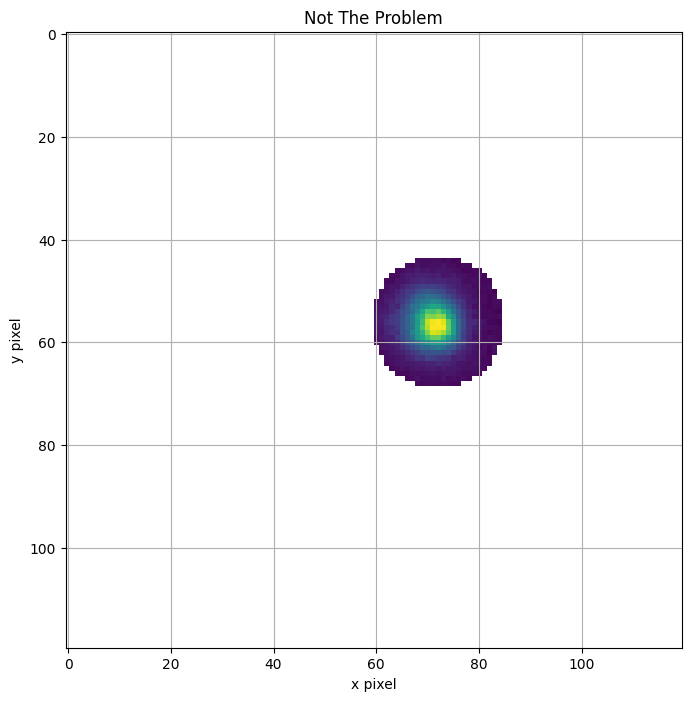

1315587.934495295


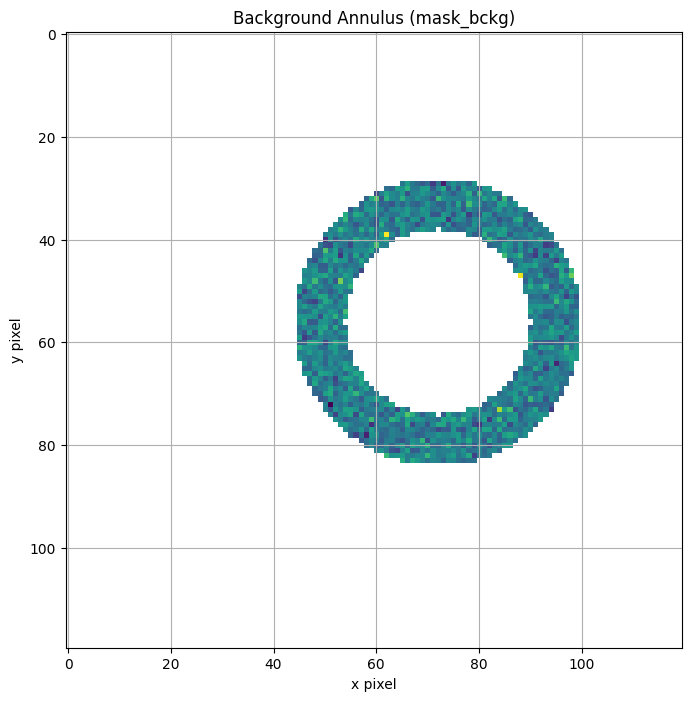

13
The star flux
4689.492331514421
The star SNR
9.262644658458871


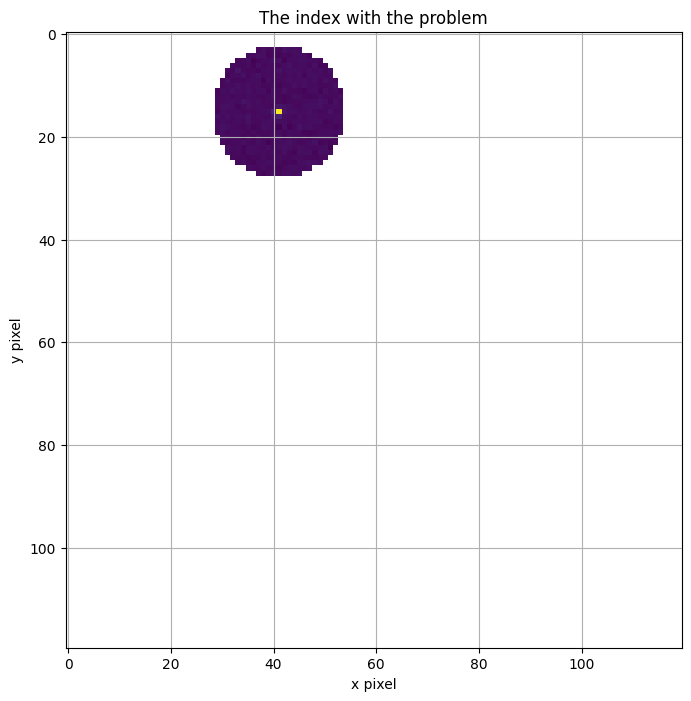

1340236.8465212544
The star seen in the background is the star 415


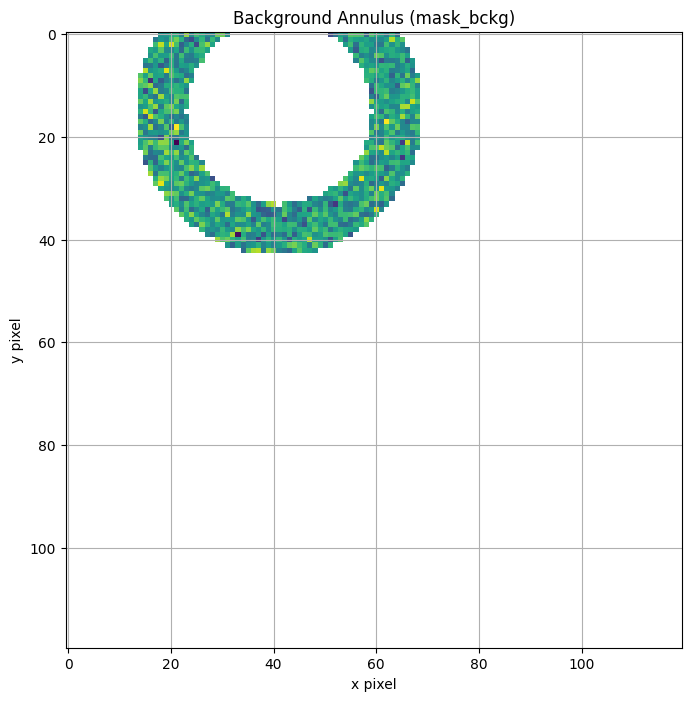

In [88]:

i=115
variable_star = Star(reduced_V[i], region_bjr_416, sci_V[i])
variable_star.photometry(thr=best_thr_array[i], thr1=best_thr_array[i]+5, thr2=best_thr_array[i]+15, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
print(best_thr_array[i])

print("The star flux")
print(variable_star.flux)
print("The star SNR")
print(variable_star.snr)
#997524.0791596372
#904.0473818662686

#sz_lyn_lc.snr[14]=variable_star.snr
#best_background_min[14]=thr1
#best_background_max[14]=thr2

#print(variable_star.snr)

plot_2d(variable_star.targ_sub, vrange=None)
plt.title("Not The Problem")
plt.grid('True')
plt.show()
#sz_lyn_lc.flux[14]=variable_star.flux
#1265836.5739887592
#1268466.2813722242
#1269288.1833080759
print(sz_lyn_lc.flux[i])
##The one before has 1366785.4760777184
masked_bckg = np.full_like(variable_star.sub_img, np.nan)
masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]
plot_2d(masked_bckg, vrange=None)
plt.title("Background Annulus (mask_bckg)")
plt.grid('True')
plt.show()

i=116


variable_star = Star(reduced_V[i], region_bjr_416, sci_V[i]) # What I have seen is that if I go near 415 region I get the star but it would
#be 415
variable_star.photometry(thr=best_thr_array[i], thr1=best_thr_array[i]+5, thr2=best_thr_array[i]+15, gain=sci_V[i].header['EGAIN'], ron=10.0, frame_2=sci_V[i])
print(best_thr_array[i])

print("The star flux")
print(variable_star.flux)
print("The star SNR")
print(variable_star.snr)
#997524.0791596372
#904.0473818662686

#sz_lyn_lc.snr[14]=variable_star.snr
#best_background_min[14]=thr1
#best_background_max[14]=thr2

#print(variable_star.snr)

plot_2d(variable_star.targ_sub, vrange=None)
plt.title("The index with the problem")
plt.grid('True')
plt.show()
#sz_lyn_lc.flux[14]=variable_star.flux
#1265836.5739887592
#1268466.2813722242
#1269288.1833080759
print(sz_lyn_lc.flux[i])
##The one before has 1366785.4760777184
print("The star seen in the background is the star 415")
masked_bckg = np.full_like(variable_star.sub_img, np.nan)
masked_bckg[variable_star.mask_bckg] = variable_star.sub_img[variable_star.mask_bckg]
plot_2d(masked_bckg, vrange=None)
plt.title("Background Annulus (mask_bckg)")
plt.grid('True')
plt.show()




## TRYING TO UNDERSTAND WHY

In [90]:
def rectangle(ax, reg=None):
    import matplotlib.patches as patches
    x = reg[1].start
    y = reg[0].start
    dx = reg[1].stop-x
    dy = reg[0].stop-y
    r = patches.Rectangle((x, y), dx, dy, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(r)
    return ax

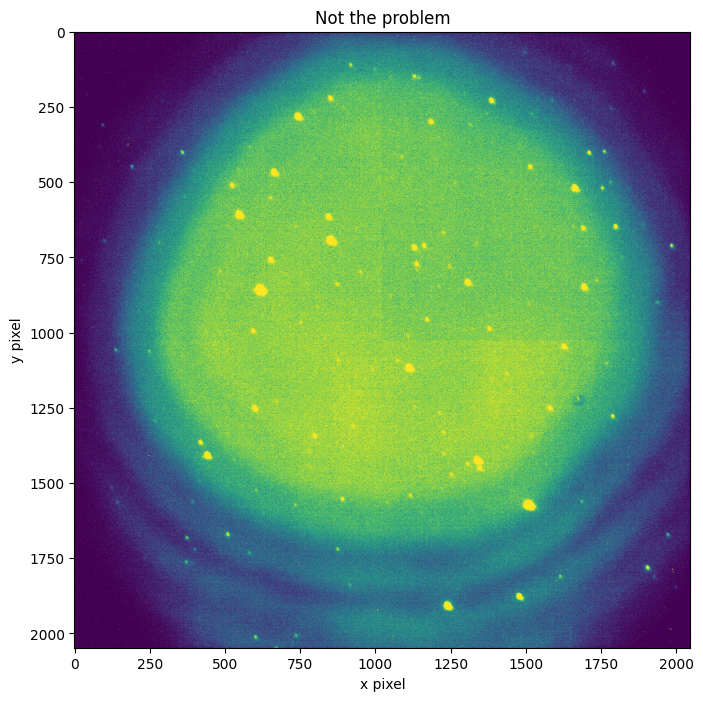

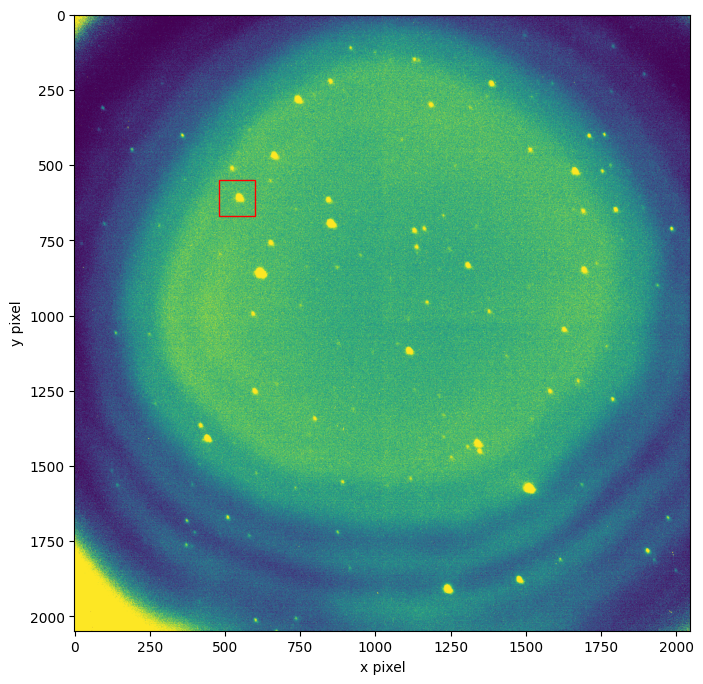

In [92]:
plot_2d(sci_V[117].data)
plt.title("Not the problem")
ax = plot_2d(reduced_V[117])
rectangle(ax, region_bjr_416)
plt.show()


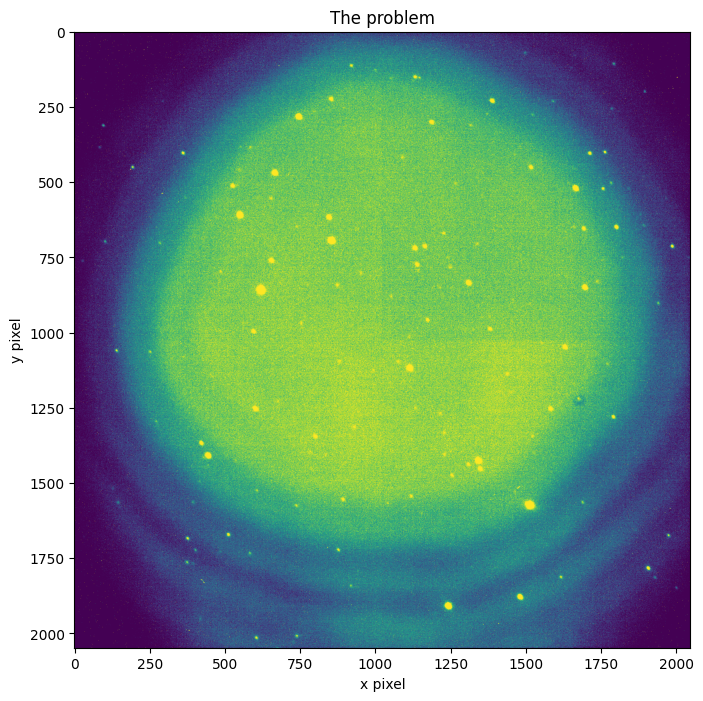

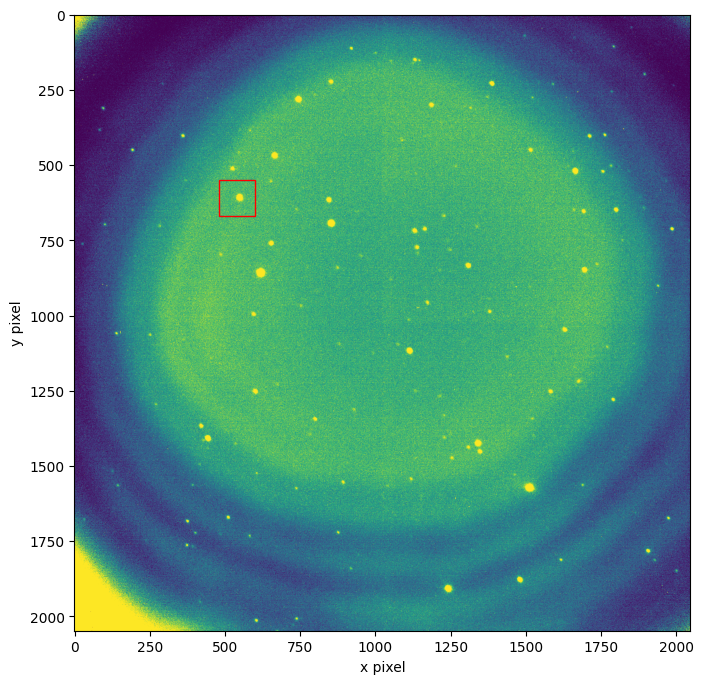

In [97]:
plot_2d(sci_V[116].data)


plt.title("The problem")
ax = plot_2d(reduced_V[115])
rectangle(ax, region_bjr_416)
plt.show()

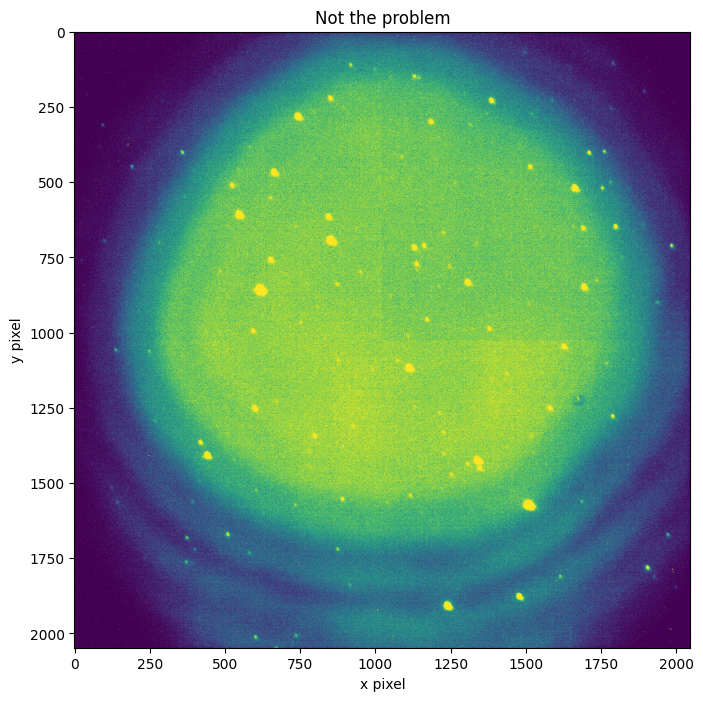

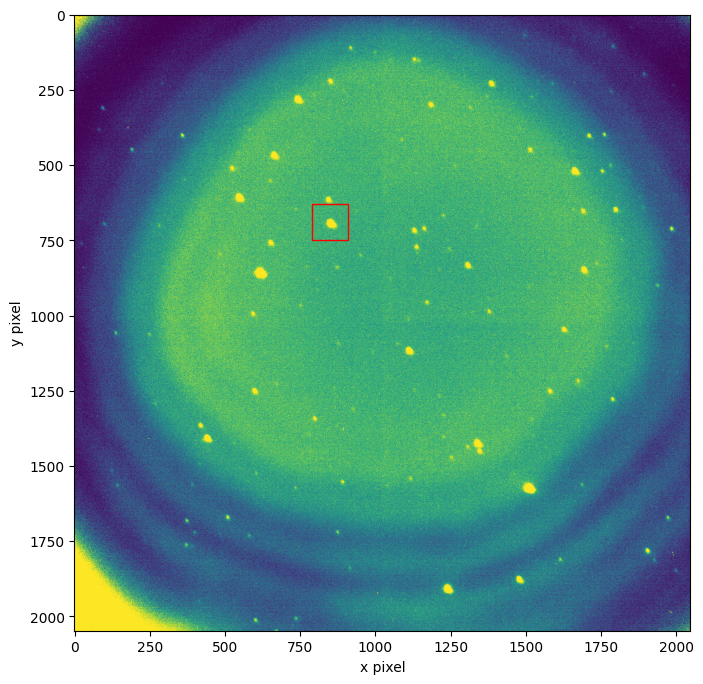

In [98]:
plot_2d(sci_V[117].data)
plt.title("Not the problem")
ax = plot_2d(reduced_V[117])
rectangle(ax, region_bjr_415)
plt.show()


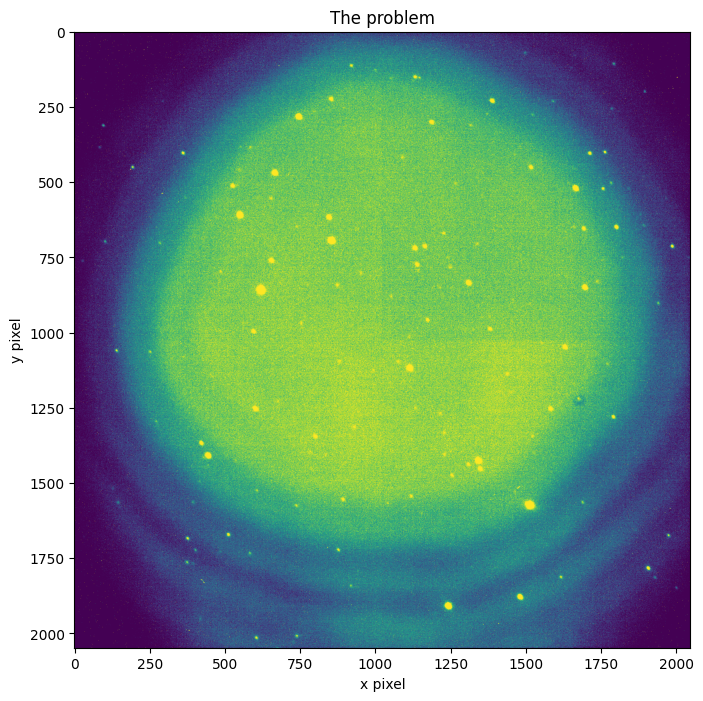

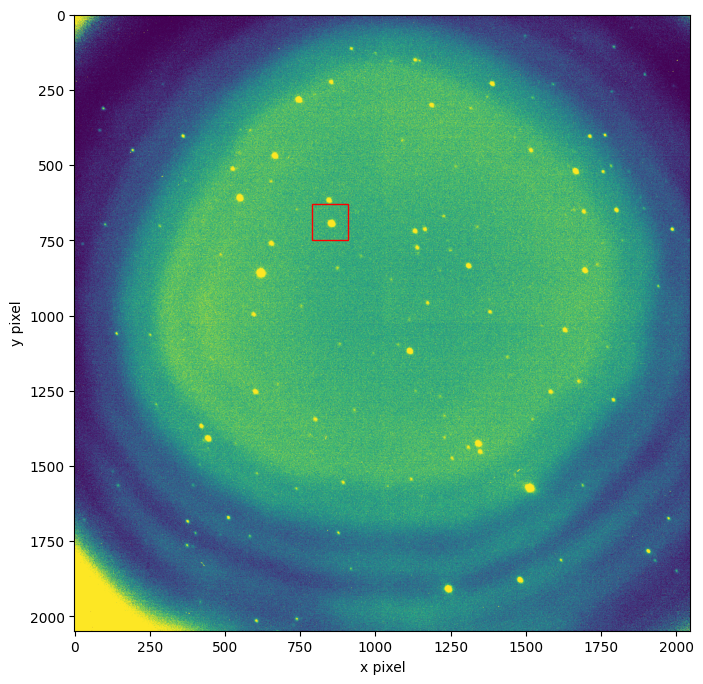

In [100]:
plot_2d(sci_V[116].data)
plt.title("The problem")
ax = plot_2d(reduced_V[116])
rectangle(ax, region_bjr_415)
plt.show()
